# **Cross-cultural Romantic Analysis**

Project Members: Madeline Boss, Anthony Yang, Aishwarya Sreenivasan, Diya Shah, Samhitha Kunadharaju

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pxi
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, f1_score, recall_score,
                             precision_score, confusion_matrix, log_loss, brier_score_loss)
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from scipy.stats import ttest_ind, f_oneway, chi2_contingency
from xgboost import XGBClassifier
from codecarbon import EmissionsTracker
import time
import statsmodels.stats.multitest as smm
import scipy.stats as stats
import math
import shap

In [ ]:
df = pd.read_csv('cultural_romance.csv', encoding = "latin-1", delimiter = ';')

/tmp/ipython-input-2760288183.py:1: DtypeWarning: Columns (21,22,68,109,110,111,271,272,273) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('cultural_romance.csv', encoding = "latin-1", delimiter = ';')


## Data Wrangling

In [ ]:
# Filter relevant columns
columns = ['Country_live', "Age", "Sex", "Religion_type", "Sexual_Orientation", "Employment", "Relationship_status",
    "cot_educ", "cot_politics", "cot_class", "Time_social_media_1", "Time_watching_TV_1", "Time_free_1",
    "self_physatt", "self_resources", "self_kind", "self_health", "self_religion",
    "ideallt_physatt", "ideallt_resources", "ideallt_kind", "ideallt_health", "ideallt_religion", "ideallt_age",
    "idealst_physatt", "idealst_resources", "idealst_kind", "idealst_health", "idealst_religion", "idealst_age",
    "Gender_Equality_1", "Gender_Equality_2", "Gender_Equality_3",
    "Individualism_col_1", "Individualism_col_2", "Individualism_col_3", "Individualism_col_4",
    "qoa", "soi_behave", "soi_attitude", "soi_desire", "relmob", "jealemo", "jealsex", "infmoral_sex", "infmoral_emo",
    "prqc_1", "prqc_2", "prqc_3", "prqc_4", "prqc_5", "prqc_6", "infidelity"]

# Replace NA values with 0 for infidelity-related columns
for i, row in df.iterrows():
    if row['infidelity'] == 0:
        df['infidelity_emo'] = 0 #No emotional infidelity
        df['infidelity_sex'] = 0 #No sexual infildelity
        df['infidelity_inv'] = 8 #Did not cheat

# Drop rows with missing values
df = df[columns].dropna()

In [ ]:
# Drop rows in 'Employment' column with multiple values
df['Employment'] = df['Employment'].astype(str)
df = df[~df['Employment'].str.contains(',', na=False)]

# Convert all columns to int64 except for Country_live
for col in df.columns:
    if col != 'Country_live':
        df[col] = df[col].astype('int64')

In [ ]:
# Map numeric values to readable labels
# Define mappings
sex_map = {
    0: "Male",
    1: "Female",
    2: "Non-binary",
    3: "No answer"
}

orientation_map = {
    1: "Straight",
    2: "Gay",
    3: "Lesbian",
    4: "Bisexual",
    5: "Pansexual",
    6: "Asexual",
    7: "No answer",
    8: "Other"
}

religion_map = {
    1: "Christianity",
    2: "Islam",
    3: "Hinduism",
    4: "Buddhism",
    5: "Other",
    6: "Judaism",
    7: "None"
}

relationship_map = {
    0: "Single",
    1: "Dating",
    2: "Committed",
    3: "Married"
}

employment_map = {
    1: "Full Time",
    2: "Part Time",
    3: "Self Employed",
    4: "Unemployed",
    5: "Student",
    6: "Retired"
}

agelt_map = {
    1: "Under 20",
    2: "21-26",
    3: "27-32",
    4: "33-38",
    5: "39-44",
    6: "45-50",
    7: "51-56",
    8: "57-62",
    9: "63-68",
    10: "69-74",
    11: "Over 75"
}

agest_map = {
    1: "Under 20",
    2: "21-26",
    3: "27-32",
    4: "33-38",
    5: "39-44",
    6: "45-50",
    7: "51-56",
    8: "57-62",
    9: "63-68",
    10: "69-74",
    11: "Over 75"
}

df["Sex_label"] = df["Sex"].map(sex_map)
df["Sexual_Orientation_label"] = df["Sexual_Orientation"].map(orientation_map)
df["Religion_type_label"] = df["Religion_type"].map(religion_map)
df["ideallt_religion_label"] = df["ideallt_religion"].map(religion_map)
df["idealst_religion_label"] = df["idealst_religion"].map(religion_map)
df["Relationship_status_label"] = df["Relationship_status"].map(relationship_map)
df["Employment_label"] = df["Employment"].map(employment_map)
df["ideallt_age_label"] = df["ideallt_age"].map(agelt_map)
df["idealst_age_label"] = df["idealst_age"].map(agest_map)

In [ ]:
df.shape

(37674, 62)

In [ ]:
count = df[
    (df["Relationship_status"] == 0) &
    (df["infidelity"] == 1)
].shape[0]

print("Number of single people who have cheated in the past:", count)

Number of single people who have cheated in the past: 199


## Exploratory Data Analysis

### Key Data Visualizations

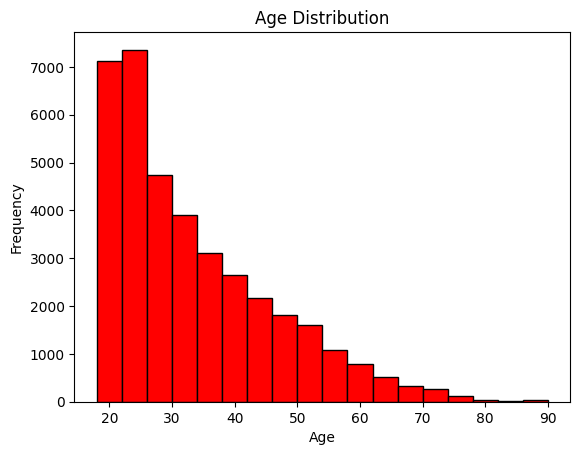

count    37674.000000
mean        32.953469
std         12.846981
min         18.000000
25%         23.000000
50%         29.000000
75%         40.000000
max         90.000000
Name: Age, dtype: float64


In [ ]:
# Distribution of Age
plt.hist(df['Age'], bins = 18, edgecolor = 'black', color = 'r')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution')
plt.show()

print(df['Age'].describe())


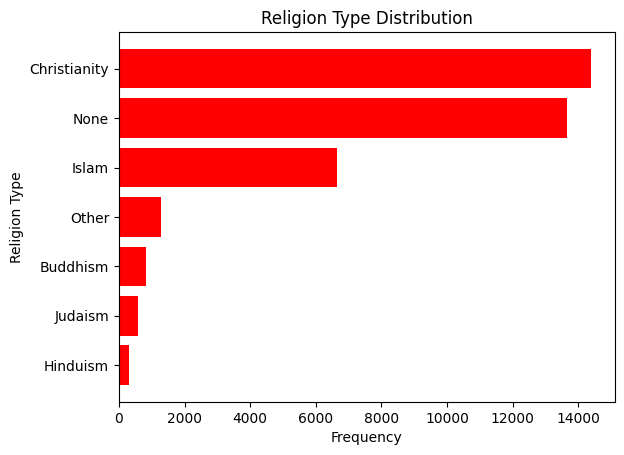



--- Religion Type Counts ---
Religion Type  Count
 Christianity  14395
         None  13661
        Islam   6651
        Other   1274
     Buddhism    828
      Judaism    567
     Hinduism    298


In [ ]:
# Distribution of Religion Types
religion_counts = df['Religion_type_label'].value_counts().sort_values(ascending=True)
plt.barh(religion_counts.index, religion_counts.values, color = 'r')
plt.xlabel("Frequency")
plt.ylabel("Religion Type")
plt.title("Religion Type Distribution")
plt.show()

table = pd.DataFrame({
    'Religion Type': religion_counts.index,
    "Count": religion_counts.values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Religion Type Counts ---")
print(table.to_string(index=False))

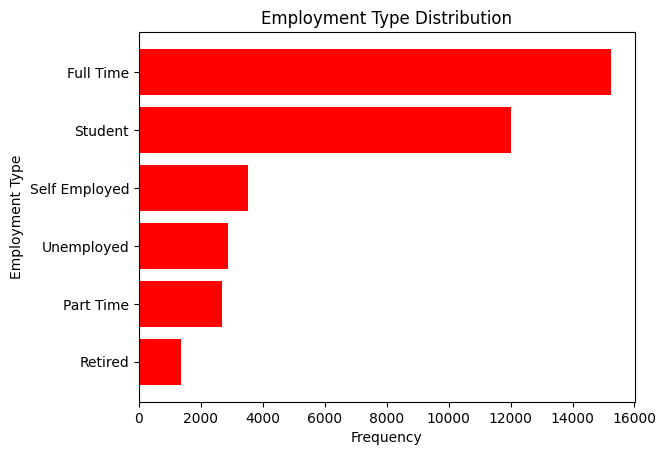



--- Employment Type Counts ---
Employment Type  Count
      Full Time  15251
        Student  12015
  Self Employed   3512
     Unemployed   2878
      Part Time   2673
        Retired   1345


In [ ]:
# Distribution of Employment Types
employment_counts = df['Employment_label'].value_counts().sort_values(ascending=True)
plt.barh(employment_counts.index, employment_counts.values, color = 'r')
plt.xlabel("Frequency")
plt.ylabel("Employment Type")
plt.title("Employment Type Distribution")
plt.show()

table = pd.DataFrame({
    'Employment Type': employment_counts.index,
    "Count": employment_counts.values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Employment Type Counts ---")
print(table.to_string(index=False))

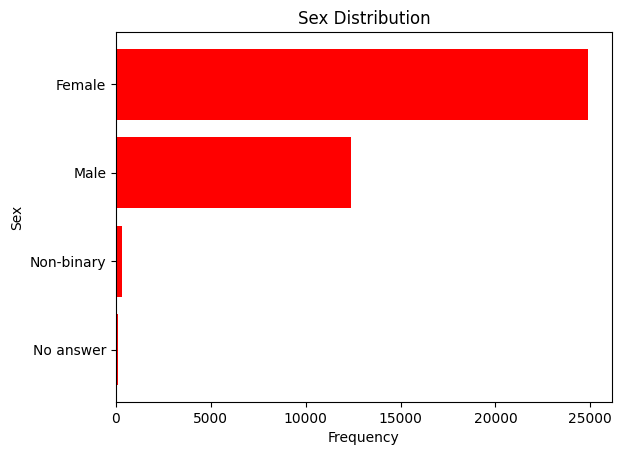



--- Sex Counts ---
       Sex  Count
    Female  24891
      Male  12392
Non-binary    296
 No answer     95


In [ ]:
# Distribution of Sex
sex_counts = df['Sex_label'].value_counts().sort_values(ascending=True)
plt.barh(sex_counts.index, sex_counts.values, color = 'r')
plt.xlabel("Frequency")
plt.ylabel("Sex")
plt.title("Sex Distribution")
plt.show()

table = pd.DataFrame({
    'Sex': sex_counts.index,
    "Count": sex_counts.values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Sex Counts ---")
print(table.to_string(index=False))

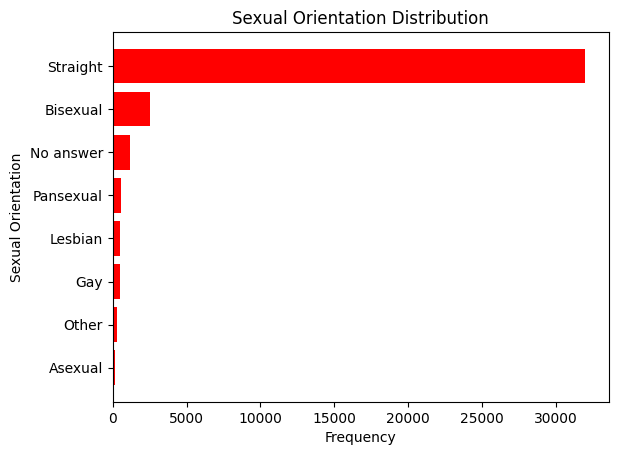



--- Sexual Orientation Counts ---
Sexual Orientation  Count
          Straight  31952
          Bisexual   2496
         No answer   1150
         Pansexual    582
           Lesbian    509
               Gay    507
             Other    308
           Asexual    170


In [ ]:
# Distribution of Sexual Orientation
orientation_counts = df['Sexual_Orientation_label'].value_counts().sort_values(ascending=True)
plt.barh(orientation_counts.index, orientation_counts.values, color = 'r')
plt.xlabel('Frequency')
plt.ylabel('Sexual Orientation')
plt.title('Sexual Orientation Distribution')
plt.show()

table = pd.DataFrame({
    'Sexual Orientation': orientation_counts.index,
    "Count": orientation_counts.values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Sexual Orientation Counts ---")
print(table.to_string(index=False))

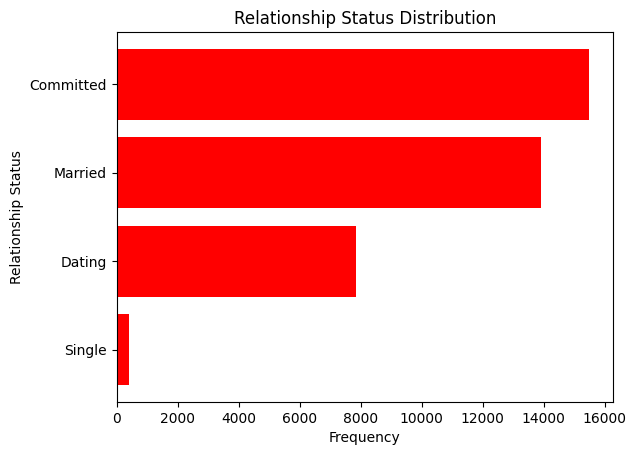



--- Relationship Status Counts ---
Relationship Status  Count
          Committed  15488
            Married  13913
             Dating   7858
             Single    415


In [ ]:
# Distribution of Relationship Statuses
relationship_counts = df['Relationship_status_label'].value_counts().sort_values(ascending=True)
plt.barh(relationship_counts.index, relationship_counts.values, color = 'r')
plt.xlabel("Frequency")
plt.ylabel("Relationship Status")
plt.title("Relationship Status Distribution")
plt.show()

table = pd.DataFrame({
    'Relationship Status': relationship_counts.index,
    "Count": relationship_counts.values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Relationship Status Counts ---")
print(table.to_string(index=False))

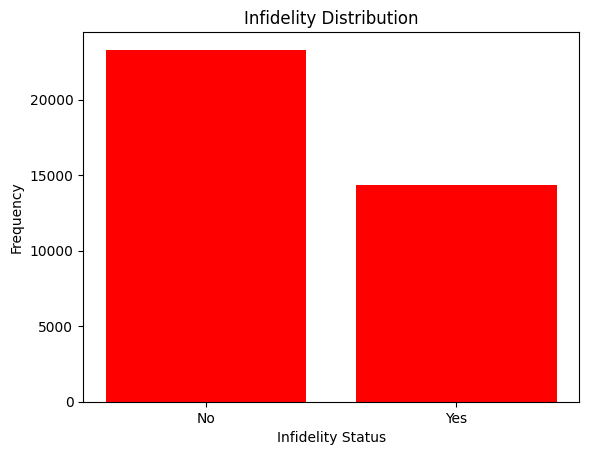



--- Infidelty Counts ---
Infidelity  Count
        No  23302
       Yes  14372


In [ ]:
# Distribution of Cheaters
cheater_categories = ["No", "Yes"]
cheater_counts = [0, 1]

plt.bar(df['infidelity'].value_counts().index, df['infidelity'].value_counts().values, color = 'r')
plt.xlabel('Infidelity Status')
plt.ylabel('Frequency')
plt.xticks(cheater_counts, cheater_categories)
plt.title('Infidelity Distribution')
plt.show()

table = pd.DataFrame({
    'Infidelity': cheater_categories,
    "Count": df['infidelity'].value_counts().values
}).sort_values(by = 'Count', ascending = False)

print("\n")
print(f"--- Infidelty Counts ---")
print(table.to_string(index=False))

In [ ]:
# Distribution of countries on world map
map_data = df.groupby("Country_live").size().reset_index(name='Count')

fig = pxi.choropleth(
    map_data,
    locations="Country_live",
    locationmode="country names",
    color="Count",
    color_continuous_scale="Reds",
    title="World Map of Particpants"
)

fig.show()

### Hypothesis 1: Can relationship statuses be predicted based on certain characteristics?

In [ ]:
# Creating a sub dataset
columns_to_keep = ["Time_social_media_1", "Time_watching_TV_1", "Time_free_1",
                   "Gender_Equality_1", "Gender_Equality_2", "Gender_Equality_3",
                   "Individualism_col_1", "Individualism_col_2", "Individualism_col_3",
                   "Individualism_col_4", "Religion_type", "Sexual_Orientation", "Age",
                   "self_physatt", "self_resources", "self_kind", "self_religion",
                   "cot_educ", "cot_politics", "cot_class", "Employment", "qoa",
                   "soi_behave", "soi_attitude", "soi_desire", "relmob", 'Relationship_status']

df_1 = df[columns_to_keep]

In [ ]:
# Determine statistically significant variables with relationship status
significant_columns = []

# Continuous Variables - ANOVA test
continuous_variables = ["Age", "Time_social_media_1", "Time_watching_TV_1", "Time_free_1"]

for var in continuous_variables:
    groups = [df_1[df_1['Relationship_status'] == i][var].dropna() for i in df_1['Relationship_status'].unique()]
    f_stat, p_val = f_oneway(*groups)
    if p_val < 0.05:
      print(f"ANOVA for {var}: F-statistic = {f_stat}, p-value = {p_val}")
      significant_columns.append(var)

ANOVA for Age: F-statistic = 5792.478034634053, p-value = 0.0
ANOVA for Time_social_media_1: F-statistic = 731.5883549532039, p-value = 0.0
ANOVA for Time_watching_TV_1: F-statistic = 105.17221935381822, p-value = 8.371105850109936e-68
ANOVA for Time_free_1: F-statistic = 554.2577934997278, p-value = 0.0


In [ ]:
# Categorical Variables - Chi-Squared Test
categorical_vars = df_1.drop(['Age', 'Time_social_media_1', 'Time_watching_TV_1', 'Time_free_1', 'Relationship_status'], axis = 1).columns

for var in categorical_vars:
    contingency_table = pd.crosstab(df_1['Relationship_status'], df_1[var])
    chi2, p_val, dof, expected = chi2_contingency(contingency_table)
    if p_val < 0.05:
      print(f"Chi-Squared Test for {var}: Chi-statistic = {chi2}, p-value = {p_val}")
      significant_columns.append(var)
    else:
      print(f"{var} NOT SIGNIFICANT")

Chi-Squared Test for Gender_Equality_1: Chi-statistic = 2623.9112707769405, p-value = 0.0
Chi-Squared Test for Gender_Equality_2: Chi-statistic = 2095.956040393434, p-value = 0.0
Chi-Squared Test for Gender_Equality_3: Chi-statistic = 1867.4218694436472, p-value = 0.0
Chi-Squared Test for Individualism_col_1: Chi-statistic = 489.57647552498776, p-value = 1.6180500113256237e-92
Chi-Squared Test for Individualism_col_2: Chi-statistic = 547.6429984577918, p-value = 9.724837157091896e-105
Chi-Squared Test for Individualism_col_3: Chi-statistic = 356.0745622074478, p-value = 1.2525828167644526e-64
Chi-Squared Test for Individualism_col_4: Chi-statistic = 821.3357122225614, p-value = 9.123128440402005e-163
Chi-Squared Test for Religion_type: Chi-statistic = 2967.05213556862, p-value = 0.0
Chi-Squared Test for Sexual_Orientation: Chi-statistic = 850.5720180236681, p-value = 1.6925999847570207e-166
Chi-Squared Test for self_physatt: Chi-statistic = 1361.022807083284, p-value = 1.53445478810283

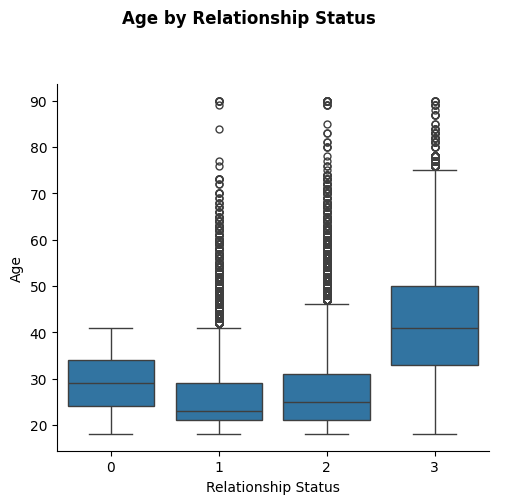

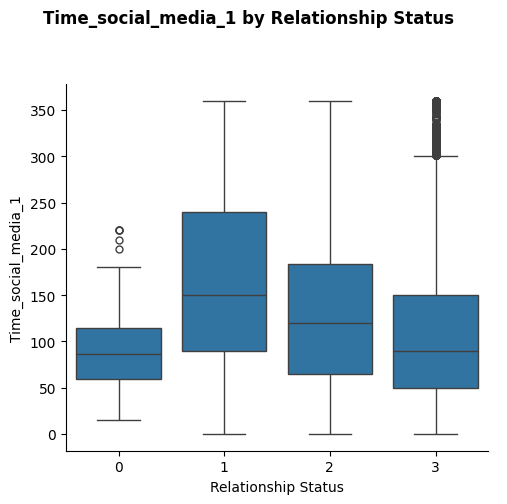

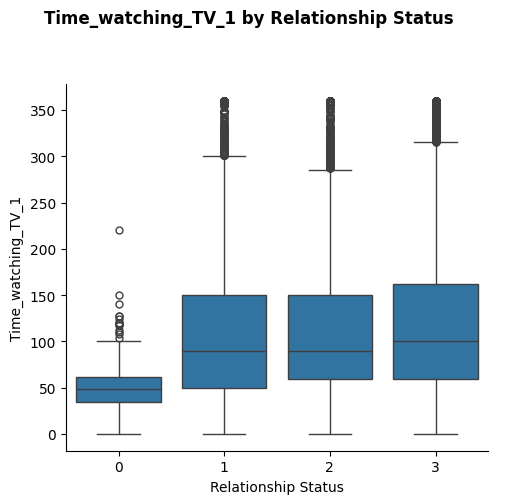

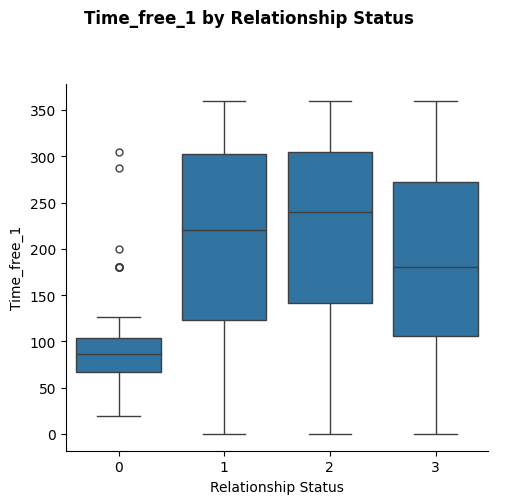

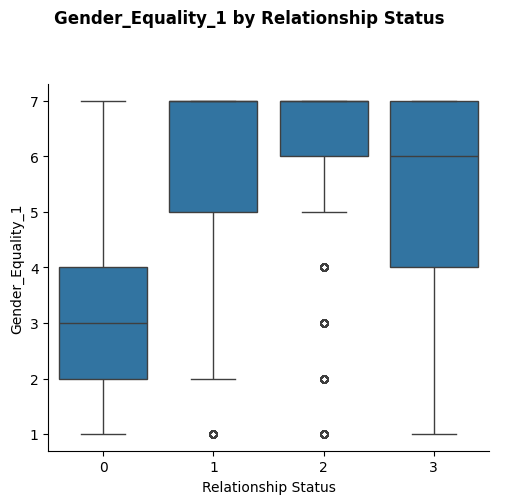

...

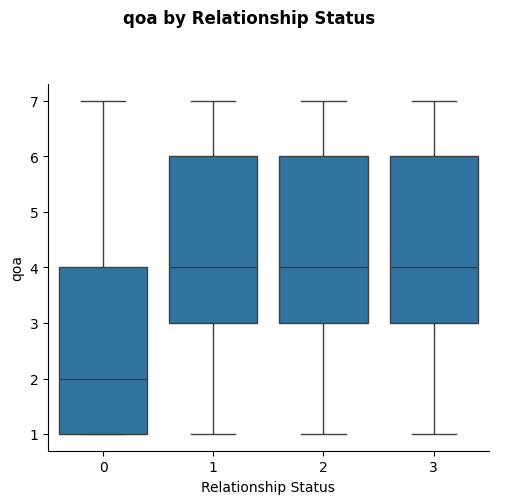

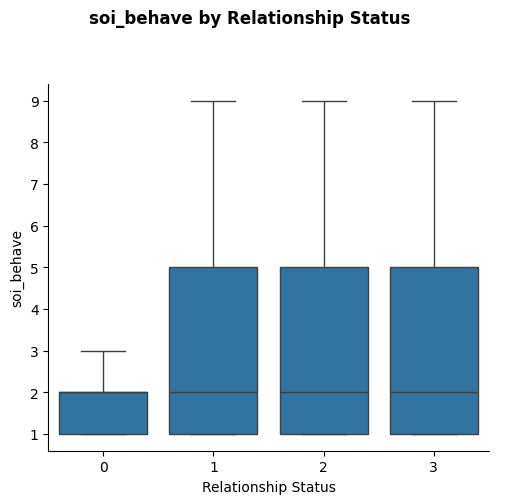

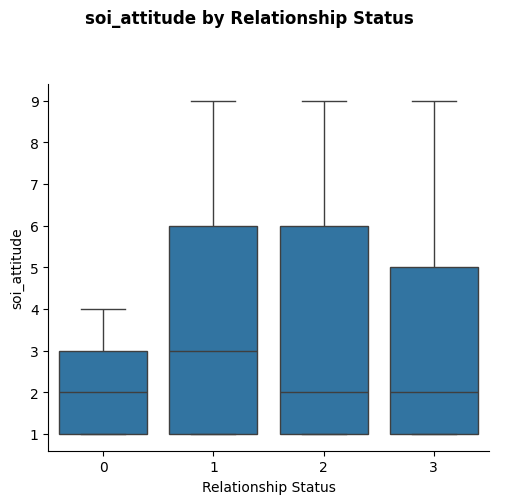

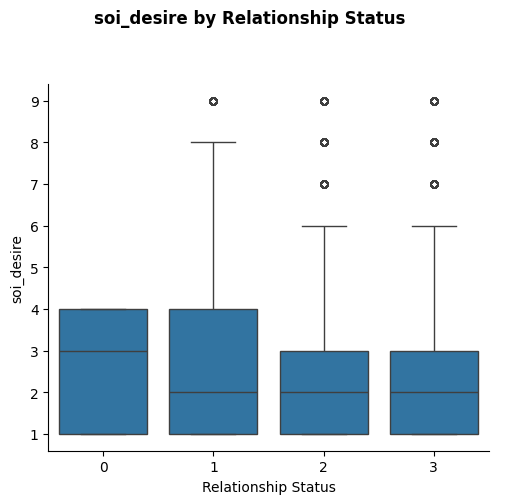

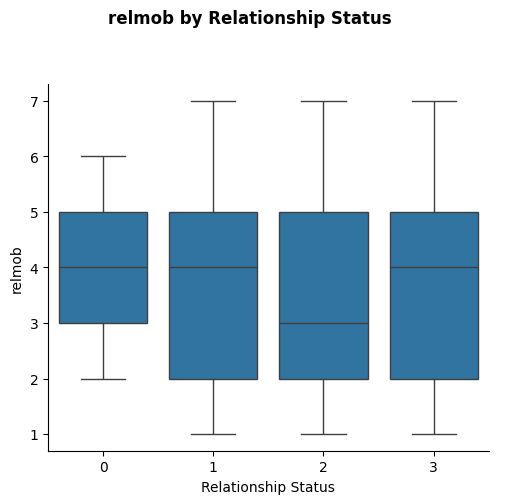

In [ ]:
# Visualizing statistically significant variables grouped by relationship statuses
for col in significant_columns:
    g = sns.catplot(
        data = df_1,
        x = 'Relationship_status',
        y = col,
        kind = 'box',
        sharey = False
    )
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"{col} by Relationship Status", fontweight="bold", y=1)
    g.set_axis_labels("Relationship Status", col)
    plt.show()


### Hypothesis 2: What are the differences in ideal partner characteristics between single and married people?

In [ ]:
# Creating a sub dataset
columns_to_keep = ["qoa", "soi_behave", "soi_attitude", "soi_desire",
                   "ideallt_physatt", "ideallt_resources", "ideallt_kind",
                   "ideallt_health", "ideallt_religion", "ideallt_age",
                   "idealst_physatt", "idealst_resources", "idealst_kind",
                   "idealst_health", "idealst_religion", "idealst_age",
                   'Relationship_status_label', 'Sex_label', 'Religion_type_label']

df_2 = df[columns_to_keep]

# Filter only Single & Married people
df_2 = df_2[df_2['Relationship_status_label'].isin(['Single', 'Married'])]

In [ ]:
# Overall Differences
overall_summary = df_2.groupby("Relationship_status_label")[
    [c for c in columns_to_keep if c not in ["Relationship_status_label", "Sex_label", "Religion_type_label"]]
].mean()

print("Overall summary (Single vs Married):")
print(overall_summary)

Overall summary (Single vs Married):
                                qoa  soi_behave  soi_attitude  soi_desire  \
Relationship_status_label                                                   
Married                    4.269460    3.158341      3.231582    2.583483   
Single                     2.513253    1.725301      2.236145    2.537349   

                           ideallt_physatt  ideallt_resources  ideallt_kind  \
Relationship_status_label                                                     
Married                           7.530511           7.323295      8.550995   
Single                            9.026506           9.236145      9.438554   

                           ideallt_health  ideallt_religion  ideallt_age  \
Relationship_status_label                                                  
Married                          8.189463          5.406814     5.024797   
Single                           9.804819          9.313253     3.007229   

                           ideal

In [ ]:
# Determining statistically significant mean differences among certain characteristics
subset = ["qoa", "soi_behave", "soi_attitude", "soi_desire",
                   "ideallt_physatt", "ideallt_resources", "ideallt_kind",
                   "ideallt_health", "ideallt_religion", "ideallt_age",
                   "idealst_physatt", "idealst_resources", "idealst_kind",
                   "idealst_health", "idealst_religion", "idealst_age"]

# Separate groups
single = df_2[df_2["Relationship_status_label"] == "Single"]
married = df_2[df_2["Relationship_status_label"] == "Married"]

# Run t-tests for every characteristic
results = []
for col in subset:
    t_stat, p_val = ttest_ind(single[col], married[col], nan_policy = 'omit')
    results.append({"Characteristic": col, "t-statistic": t_stat,"p-value": p_val})

results = pd.DataFrame(results)
results["p-adj"] = smm.multipletests(results["p-value"], method="fdr_bh")[1]

# Keep significant results
sig_results = results[results["p-adj"] < 0.05]
print(sig_results)

       Characteristic  t-statistic        p-value          p-adj
0                 qoa   -20.124221   7.621776e-89   3.048711e-88
1          soi_behave   -11.754837   9.330625e-32   1.244083e-31
2        soi_attitude    -7.603337   3.064858e-14   3.269182e-14
4     ideallt_physatt    16.396168   7.144496e-60   1.521804e-59
5   ideallt_resources    19.967617   1.627445e-87   5.207824e-87
6        ideallt_kind     9.253803   2.468257e-20   2.820865e-20
7      ideallt_health    16.392268   7.609018e-60   1.521804e-59
8    ideallt_religion    25.350188  1.000756e-138  1.601209e-137
9         ideallt_age   -21.161885   6.714486e-98   3.581059e-97
10    idealst_physatt    13.302966   3.848912e-40   6.158259e-40
11  idealst_resources    21.201855   2.949104e-98   2.359283e-97
12       idealst_kind     9.931169   3.619821e-23   4.455164e-23
13     idealst_health    13.041010   1.186770e-38   1.726210e-38
14   idealst_religion    19.298816   6.011448e-82   1.603053e-81
15        idealst_age   -

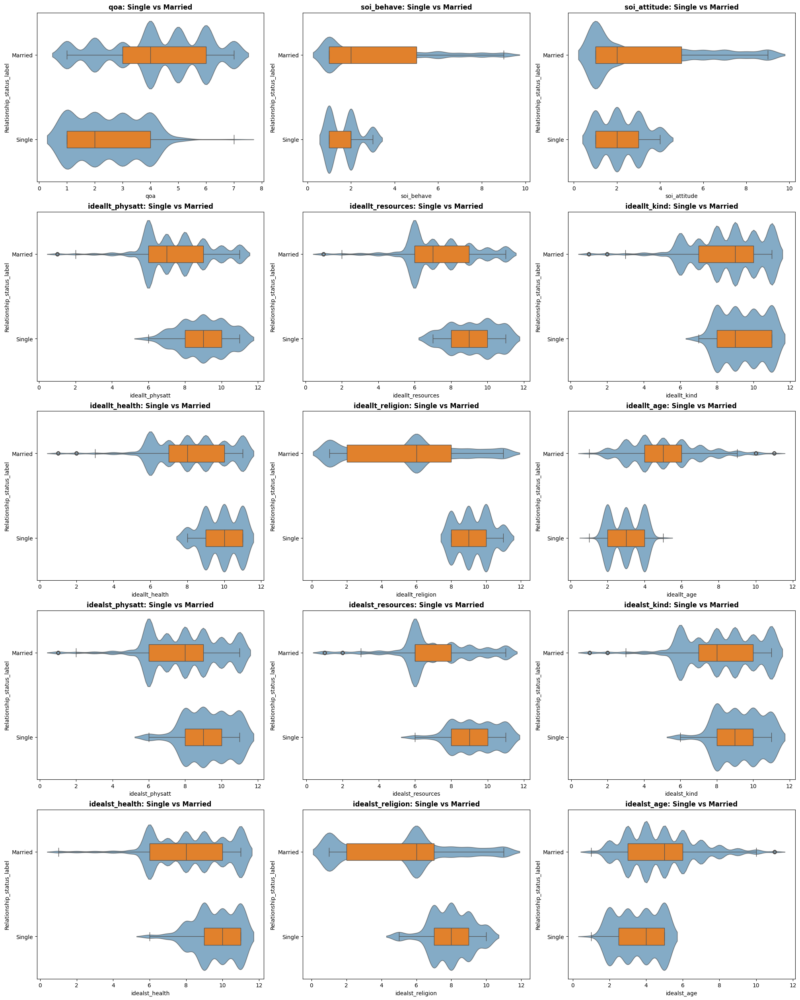

In [ ]:
# Visualizations of Significant Characteristics
sig_chars = sig_results["Characteristic"].tolist()

fig, axes = plt.subplots(5, 3, figsize=(20, 25), constrained_layout=True)

# Flatten axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(sig_chars):
    sns.violinplot(
        data = df_2,
        y="Relationship_status_label", x=col, inner=None, alpha=0.6,
        ax=axes[i]
    )
    sns.boxplot(
        data = df_2,
        y="Relationship_status_label", x=col, width=0.2, boxprops={'zorder': 2},
        ax=axes[i]
    )
    axes[i].set_title(f"{col}: Single vs Married", fontweight="bold")

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

In [ ]:
# Grouped by Sex
sex_summary = df_2.groupby(["Relationship_status_label", "Sex_label"])[
    [c for c in columns_to_keep if c not in ["Relationship_status_label", "Sex_label", "Sexual_Orientation_label", "Religion_type_label"]]].mean()

print("Sex summary (Single vs Married):")
print(sex_summary)

Sex summary (Single vs Married):
                                           qoa  soi_behave  soi_attitude  \
Relationship_status_label Sex_label                                        
Married                   Female      4.177429    2.794947      2.732027   
                          Male        4.418107    3.715375      4.002417   
                          No answer   4.035714    3.464286      3.571429   
                          Non-binary  3.885714    5.257143      5.400000   
Single                    Female      2.502439    1.721951      2.190244   
                          Male        2.523810    1.728571      2.280952   

                                      soi_desire  ideallt_physatt  \
Relationship_status_label Sex_label                                 
Married                   Female        2.082871         7.428993   
                          Male          3.366053         7.694739   
                          No answer     2.928571         7.107143   
             

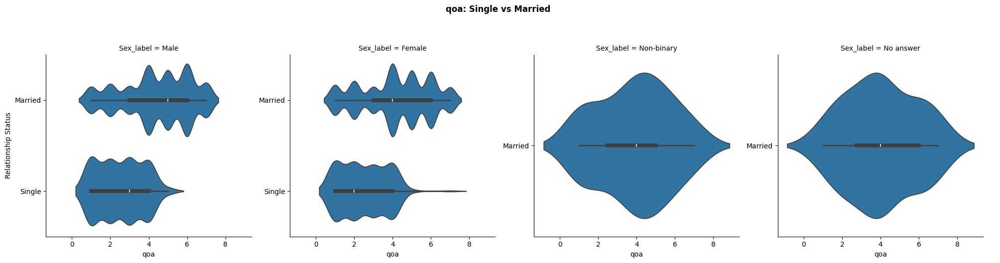

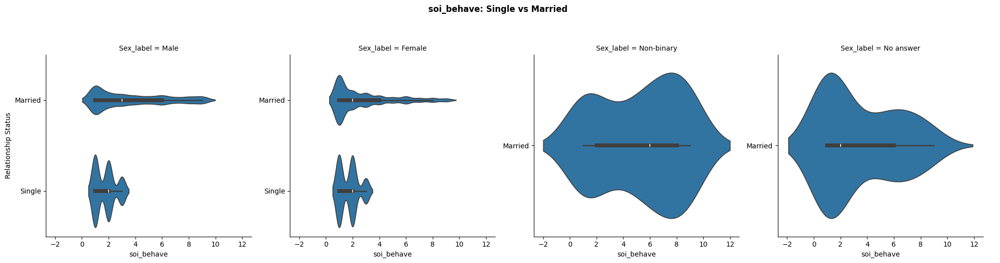

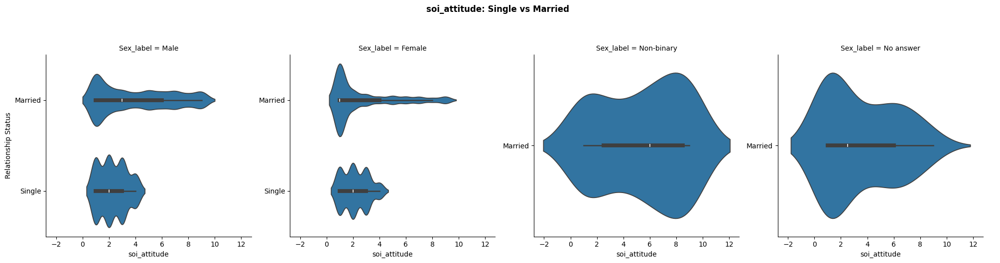

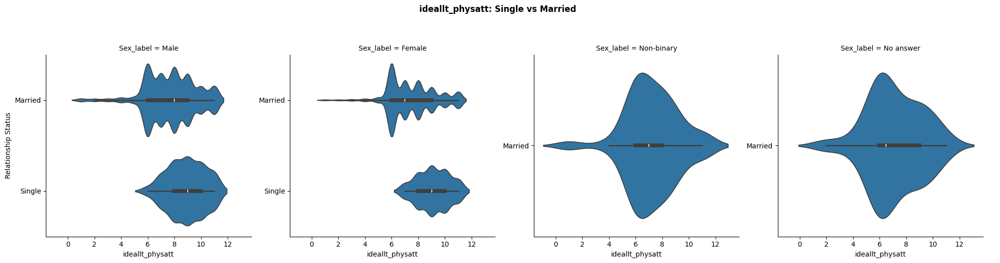

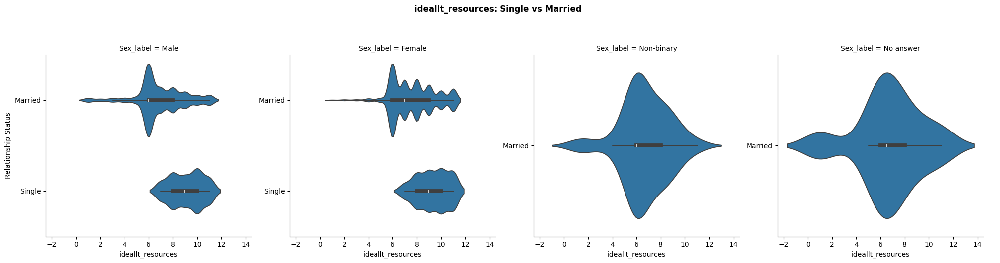

...

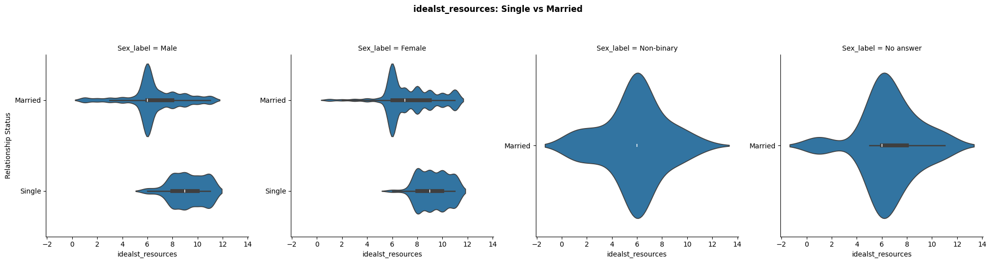

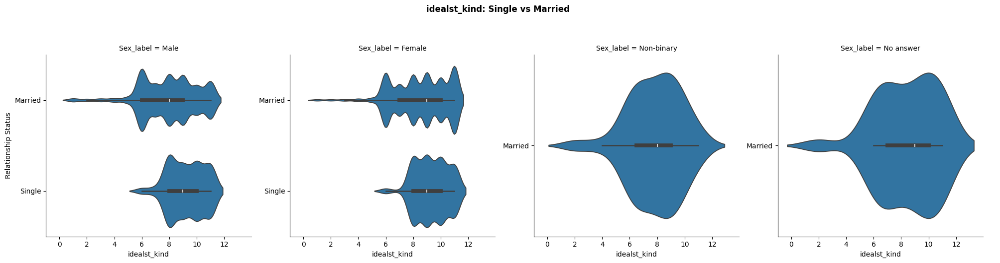

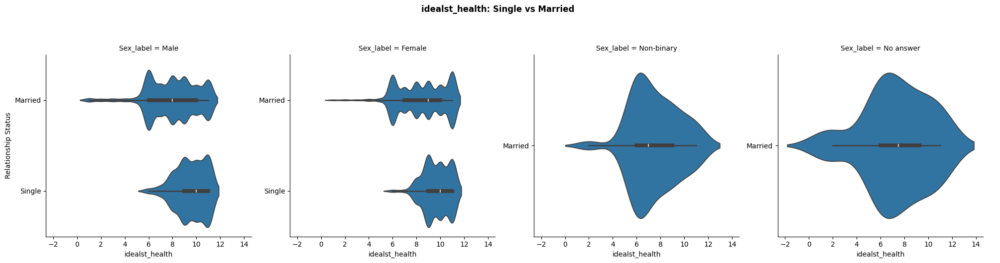

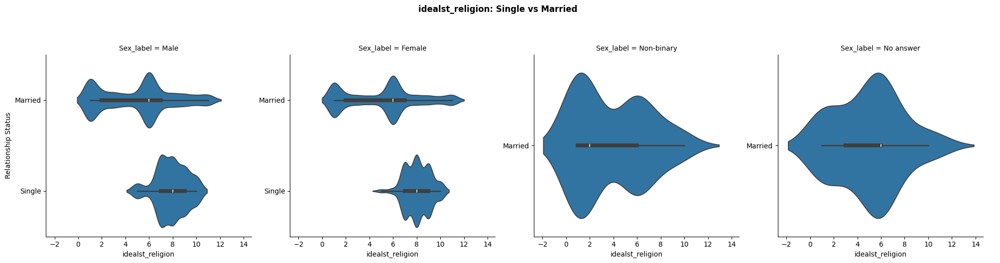

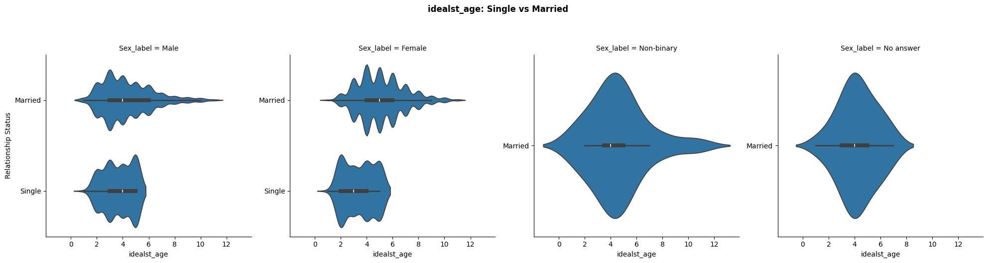

In [ ]:
# Faceted visualizations
for col in sig_results["Characteristic"]:
    g = sns.catplot(
        data = df_2,
        y = "Relationship_status_label", x = col,
        col = "Sex_label", kind = "violin", inner = "box", sharey = False)
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"{col}: Single vs Married", fontweight="bold", y=1.05)
    g.set_axis_labels(col, "Relationship Status")
    plt.show()

In [ ]:
# Grouped by Religion Type
religion_summary = df_2.groupby(["Relationship_status_label", "Religion_type_label"])[
    [c for c in columns_to_keep if c not in ["Relationship_status_label", "Sex_label", "Sexual_Orientation_label", "Religion_type_label"]]].mean()

print("Religion Type summary (Single vs Married):")
print(religion_summary)

Religion Type summary (Single vs Married):
                                                    qoa  soi_behave  \
Relationship_status_label Religion_type_label                         
Married                   Buddhism             4.473301    2.837379   
                          Christianity         4.438306    3.052597   
                          Hinduism             4.543011    2.440860   
                          Islam                3.317408    2.232655   
                          Judaism              4.865169    3.143258   
                          None                 4.489866    3.893284   
                          Other                4.321168    3.472019   
Single                    Islam                2.513253    1.725301   

                                               soi_attitude  soi_desire  \
Relationship_status_label Religion_type_label                             
Married                   Buddhism                 3.264563    2.417476   
                     

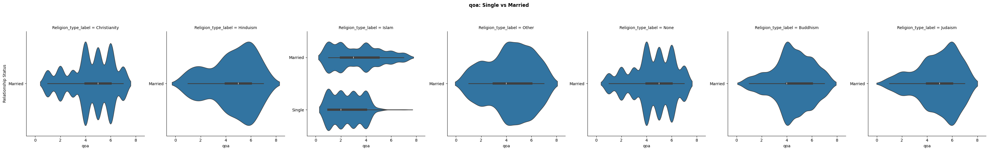

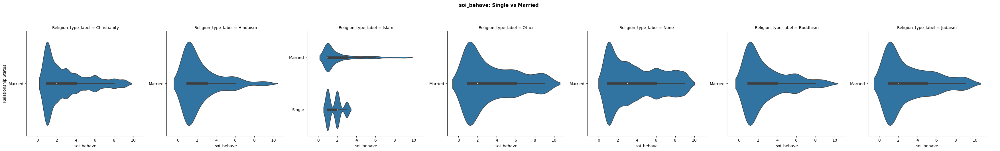

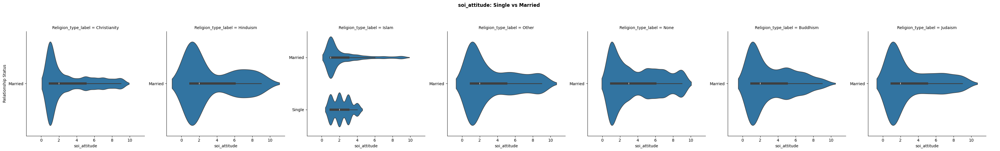

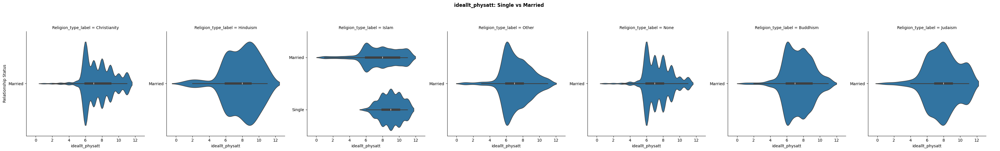

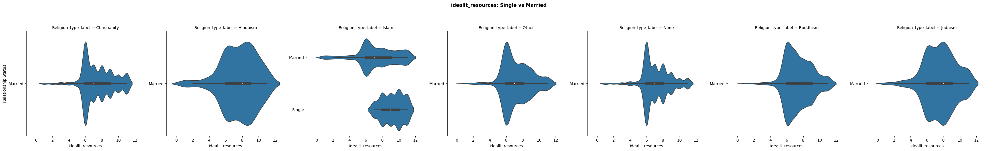

...

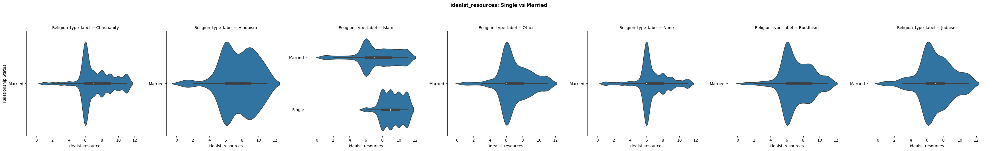

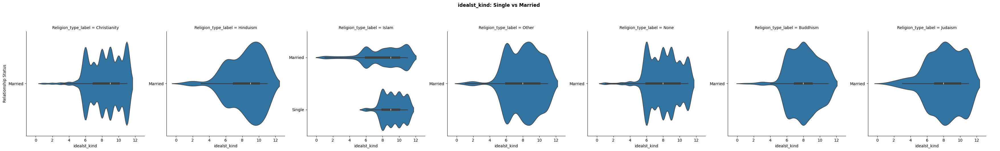

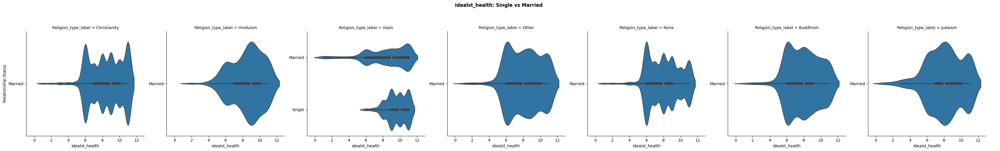

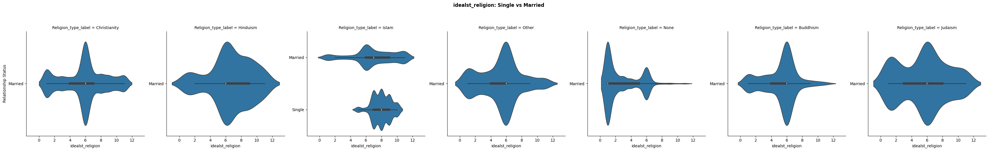

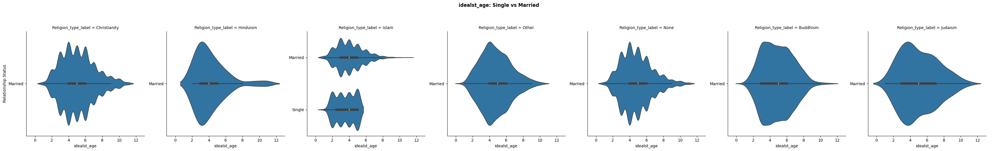

In [ ]:
# Faceted visualizations
for col in sig_results["Characteristic"]:
    g = sns.catplot(
        data = df_2,
        y = "Relationship_status_label", x = col,
        col = "Religion_type_label", kind = "violin", inner = "box", sharey = False)
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"{col}: Single vs Married", fontweight="bold", y=1.05)
    g.set_axis_labels(col, "Relationship Status")
    plt.show()

### Hypothesis 3: How do people's partners' preferences compare to their own characteristics?

In [ ]:
# Creating a sub dataset
columns_to_keep = ["ideallt_physatt", "ideallt_resources", "ideallt_kind", "ideallt_health", "ideallt_religion", "ideallt_age",
    "idealst_physatt", "idealst_resources", "idealst_kind", "idealst_health", "idealst_religion", "idealst_age",
    "self_physatt", "self_resources", "self_kind", "self_health", "self_religion", "Age", "Sex", "Relationship_status", "Religion_type"]

df_3 = df[columns_to_keep]

In [ ]:
corrst = [] #the list of correlations for the whole dataset
namest = [] #the column it is correlating to for the whole dataset
tst = []  #whether the correlation coefficient is significant for the whole dataset
tt = 0  #current t value for the whole dataset
st = True #current significance for the whole dataset
cdt = pd.DataFrame() #dataframe to hold all the data for the whole dataset

#look into each characteristic to compare w/ the self
for i in range(12):
  #sexual or romantic partner
  #find the correlation coefficient between the ideal values and the self values in the corresponding group w/ the corresponding code
  if i < 6:
    owo = np.corrcoef(df_3.iloc[:,i], df_3.iloc[:,i+12])[0,1]
  else:
    owo = np.corrcoef(df_3.iloc[:,i], df_3.iloc[:,i+6])[0,1]

  #calcualte the t value
  tt = owo / math.sqrt((1 - (owo**2)) / (len(df_3) - 2))
  #whether it was significant
  st = tt > stats.t.ppf(0.975, (len(df_3) - 2))

  #store the data
  tst.append(st)
  corrst.append(owo)
  namest.append(df_3.columns[i])

cdt["Total Correlation"] = corrst
cdt["Total" + " Significant"] = tst
cdt["Comp"] = namest

In [ ]:
results = []

#look in each comparing groups
for j in range(4):
  g = df_3.columns[j+17]
  if j == 0:
    u = [0, 20, 30, 40, 50, 60, 70, 80, 150]
    w = len(u) - 1
  else:
    u = df_3[g].unique()
    w = len(u)

  #look in each unique code in the groupings (i.e. 0-3 for Sex)
  for h in range(w):
    if j == 0:
      subset = df_3[(df_3[g] < u[h]) & (df_3[g] >= u[h-1])]
      code= f'{u[h]} - {u[h-1]}'
    else:
      subset = df_3[df_3[g] == u[h]]
      code = u[h]
    n = len(subset)

    #each characteristic to compare w/ the self
    for i in range(12):
      #sexual or romantic partner
      if i < 6:
          x, y = subset.iloc[:, i], subset.iloc[:, i+12]
      else:
          x, y = subset.iloc[:, i], subset.iloc[:, i+6]

      #find the correlation coefficient between the ideal values and the self values in the corresponding group w/ the corresponding code
      r = np.corrcoef(x, y)[0,1]

      #calcualte the t value and see whether it is significant
      if n > 2 and not np.isnan(r):
          t_val = r / math.sqrt((1 - (r**2)) / (n - 2))
          crit = stats.t.ppf(0.975, n - 2)
          sig = abs(t_val) > crit
      else:
          t_val = np.nan
          sig = np.nan

      #storing data
      results.append({
          "Variable": g,
          "Code": code,
          "Comp": df_3.columns[i],
          "Correlation": r,
          "Significant": sig
      })

cd = pd.DataFrame(results)

/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:557: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning:

invalid value encountered in divide

/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning:

Degrees of freedom <= 0 for slice

/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2773: RuntimeWarning:

divide by zero encountered in divide

/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2773: RuntimeWarning:

invalid value encountered in multiply



In [ ]:
age_grouped = cd[cd['Variable'] == 'Age']
cda = age_grouped[(abs(age_grouped['Correlation']) > 0.7) & (age_grouped['Significant'] == True)][['Variable', 'Code', 'Comp', 'Correlation']]
print(cda)

sex_grouped = cd[cd['Variable'] == 'Sex']
cds = sex_grouped[(abs(sex_grouped['Correlation']) > 0.7) & (sex_grouped['Significant'] == True)][['Variable', 'Code', 'Comp', 'Correlation']]
print(cds)

relationship_grouped = cd[cd['Variable'] == 'Relationship_status']
cdrl = relationship_grouped[(abs(relationship_grouped['Correlation']) > 0.7) & (relationship_grouped['Significant'] == True)][['Variable', 'Code', 'Comp', 'Correlation']]
print(cdrl)

religion_grouped = cd[cd['Variable'] == 'Religion_type']
cdrg = religion_grouped[(abs(religion_grouped['Correlation']) > 0.7) & (religion_grouped['Significant'] == True)][['Variable', 'Code', 'Comp', 'Correlation']]
print(cdrg)

cdts = cdt[(abs(cdt["Total Correlation"])>0.7) & (cdt['Total Significant'] == True)][["Total Correlation","Total Significant", "Comp"]]
print(cdts)


   Variable     Code              Comp  Correlation
16      Age   20 - 0  ideallt_religion     0.772134
22      Age   20 - 0  idealst_religion     0.715007
28      Age  30 - 20  ideallt_religion     0.807753
34      Age  30 - 20  idealst_religion     0.718379
40      Age  40 - 30  ideallt_religion     0.839366
46      Age  40 - 30  idealst_religion     0.764666
52      Age  50 - 40  ideallt_religion     0.812805
58      Age  50 - 40  idealst_religion     0.734957
64      Age  60 - 50  ideallt_religion     0.807498
70      Age  60 - 50  idealst_religion     0.740421
76      Age  70 - 60  ideallt_religion     0.804340
82      Age  70 - 60  idealst_religion     0.755453
88      Age  80 - 70  ideallt_religion     0.834909
94      Age  80 - 70  idealst_religion     0.802179
    Variable Code              Comp  Correlation
100      Sex    0  ideallt_religion     0.798843
101      Sex    0       ideallt_age     0.798981
106      Sex    0  idealst_religion     0.715503
107      Sex    0       

The statistically significant correlations appear to be strongest (>0.7) in a person's ideal mate's religion emphasis and age (for both romantic and sexual partners), with a positive correlation.
Based on sex, women have a slightly stronger correlation in age and religion compared to men. Every age group only has a strong positive correlation in romantic and sexual partners in their emphasis's on religion. As for relationship status, those in a commited realtionship have a higher correlation for their ideal partner's age, while those in marriage had a higher emphasis on religion, however single people had no strong correlations for anything in their ideal partner. All the religions have a strong correlation with their ideal age except Hinduism and Islam, while the Abrahamic religions (and Hinduism barely) seek out those who care about religion as much as they do.
Overall people tend to look for those with a religious emphasis and age that matches theirs in their romantic and sexual partners.

### Hypothesis 4: Can cheating be predicted?

In [ ]:
# Creating a sub dataset
columns_to_keep = ["self_physatt", "self_resources", "self_kind", "self_health",
                   "self_religion", "cot_educ", "cot_politics", "cot_class",
                   "Religion_type", "Sexual_Orientation", "Employment", "Age",
                   "Time_social_media_1", "Time_watching_TV_1", "Time_free_1",
                   "Gender_Equality_1", "Gender_Equality_2", "Gender_Equality_3",
                   "Individualism_col_1", "Individualism_col_2", "Individualism_col_3",
                   "Individualism_col_4", "qoa", "soi_behave", "soi_attitude",
                   "soi_desire", "relmob", "jealemo", "jealsex", "infmoral_sex",
                   "infmoral_emo", "prqc_1", "prqc_2", "prqc_3", "prqc_4",
                   "prqc_5", "prqc_6", "infidelity"]

df_4 = df[columns_to_keep]

In [ ]:
# Determine statistically significant variables with infidelity
significant_columns = []

# Continuous Variables - ANOVA test
continuous_variables = ["Age", "Time_social_media_1", "Time_watching_TV_1", "Time_free_1"]

for var in continuous_variables:
    groups = [df[df['infidelity'] == i][var].dropna() for i in df['infidelity'].unique()]
    f_stat, p_val = f_oneway(*groups)
    if p_val < 0.05:
      print(f"ANOVA for {var}: F-statistic = {f_stat}, p-value = {p_val}")
      significant_columns.append(var)

ANOVA for Age: F-statistic = 330.96293979211754, p-value = 1.2269050816121905e-73
ANOVA for Time_social_media_1: F-statistic = 11.652647869594313, p-value = 0.0006417867650605395
ANOVA for Time_free_1: F-statistic = 11.230468590252507, p-value = 0.0008054438824233401


In [ ]:
# Categorical Variables - Chi-Squared Test
categorical_vars = df_4.drop(['Age', 'Time_social_media_1', 'Time_watching_TV_1', 'Time_free_1', 'infidelity'], axis = 1).columns

for var in categorical_vars:
    contingency_table = pd.crosstab(df_4['infidelity'], df_4[var])
    chi2, p_val, dof, expected = chi2_contingency(contingency_table)
    if p_val < 0.05:
      print(f"Chi-Squared Test for {var}: Chi-statistic = {chi2}, p-value = {p_val}")
      significant_columns.append(var)

Chi-Squared Test for self_physatt: Chi-statistic = 100.89117121879482, p-value = 3.613692605159456e-17
Chi-Squared Test for self_resources: Chi-statistic = 66.4513106326122, p-value = 2.1369036929676383e-10
Chi-Squared Test for self_kind: Chi-statistic = 54.35724415236426, p-value = 4.162667816988296e-08
Chi-Squared Test for self_health: Chi-statistic = 37.1206996174007, p-value = 5.393597325785055e-05
Chi-Squared Test for self_religion: Chi-statistic = 140.4898432060471, p-value = 3.344609255273128e-25
Chi-Squared Test for cot_educ: Chi-statistic = 167.55948998587252, p-value = 1.4809271289611743e-33
Chi-Squared Test for cot_politics: Chi-statistic = 98.98955428068908, p-value = 1.6141276041038853e-20
Chi-Squared Test for cot_class: Chi-statistic = 65.82621029611519, p-value = 1.7234060306398343e-13
Chi-Squared Test for Religion_type: Chi-statistic = 296.4037626005955, p-value = 4.8225734957532845e-61
Chi-Squared Test for Sexual_Orientation: Chi-statistic = 240.58599366256442, p-value

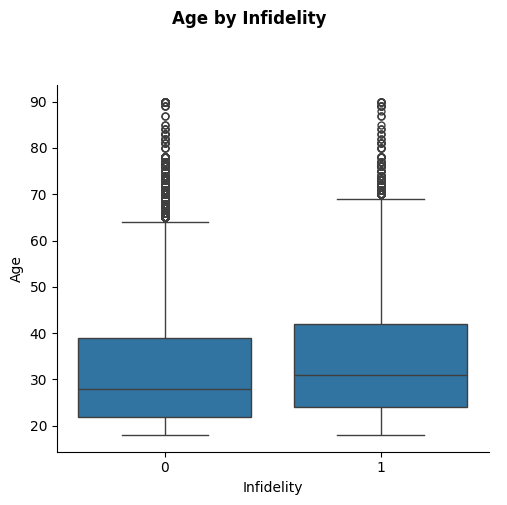

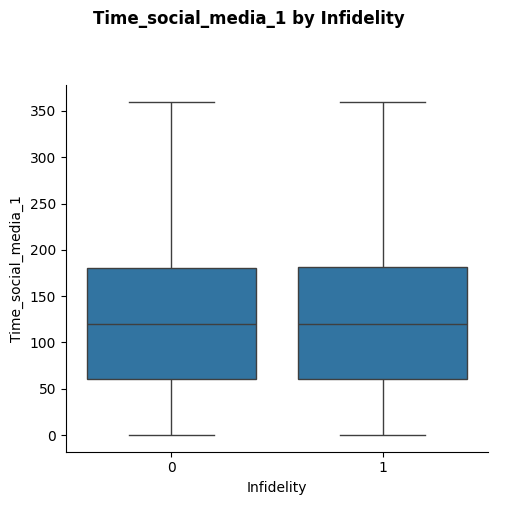

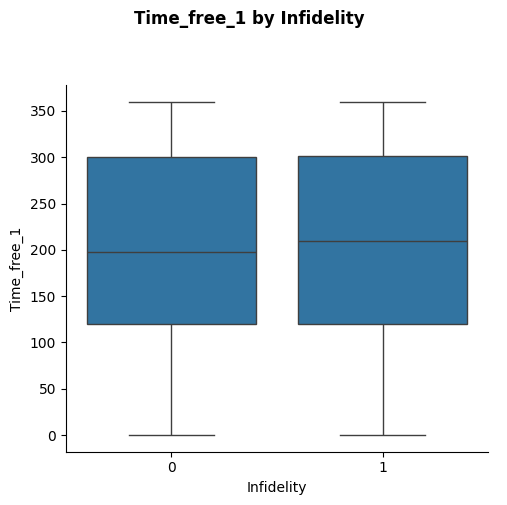

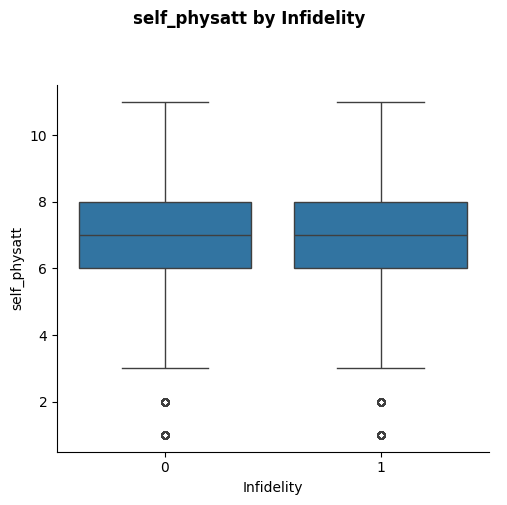

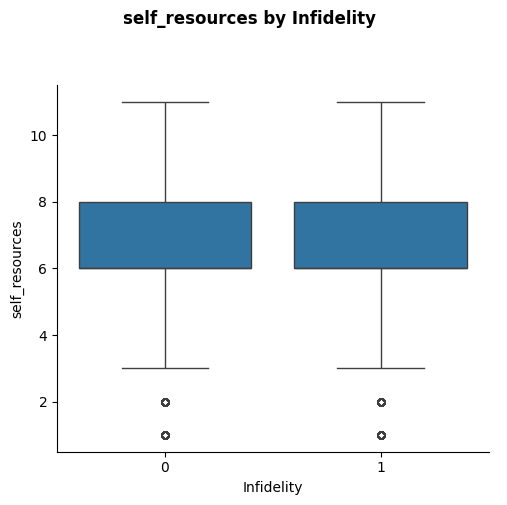

...

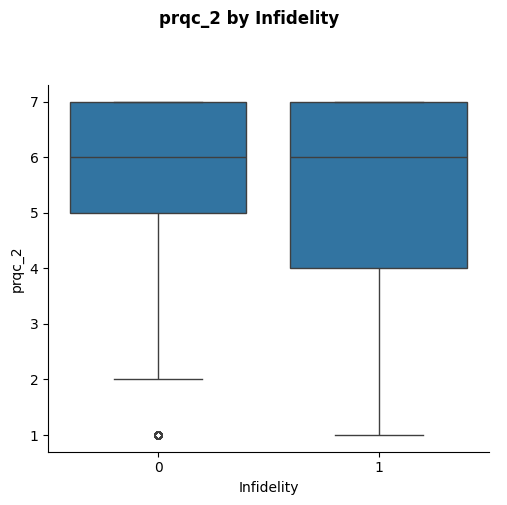

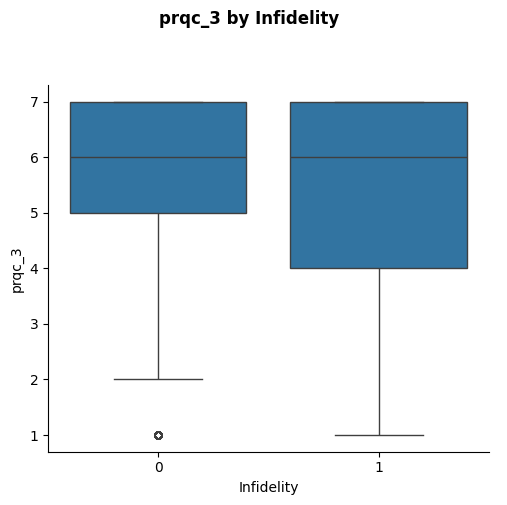

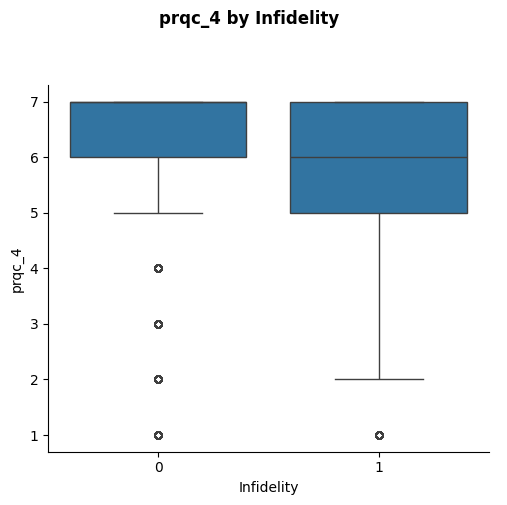

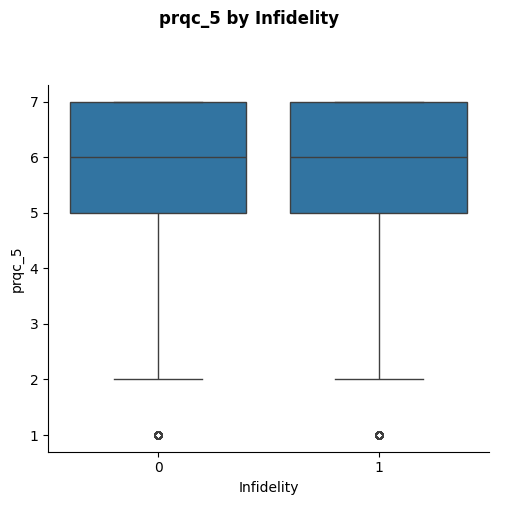

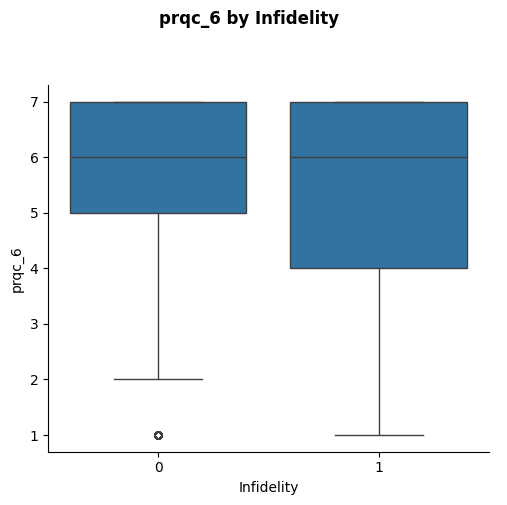

In [ ]:
# Visualizing statistically significant variables grouped by infidelity
for col in significant_columns:
    g = sns.catplot(
        data = df_4,
        x = 'infidelity',
        y = col,
        kind = 'box',
        sharey = False
    )
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"{col} by Infidelity", fontweight="bold", y=1)
    g.set_axis_labels("Infidelity", col)
    plt.show()

## Machine Learning Modeling

### Can cheating be predicted?

#### Data PreProcessing

In [ ]:
columns_to_keep = ["cot_educ", "cot_politics", "cot_class",
                   "Religion_type", "Employment", "Age",
                   "jealemo", "jealsex", "infmoral_sex",
                   "infmoral_emo", "Relationship_status",
                   "qoa", "soi_behave", "soi_attitude", "soi_desire",
                   "Gender_Equality_1", "Gender_Equality_2", "Gender_Equality_3",
                   "relmob", "Individualism_col_1", "Individualism_col_2",
                   "Individualism_col_3", "Individualism_col_4",
                   "self_kind", "self_physatt",
                   "infidelity"]
#person who using app would be like filling out the survey for the person they are testing, so some things just cant know

data = df[columns_to_keep]

In [ ]:
# Converting Age into Age_Bucket column to make it categorical
data['Age_Bucket'] = pd.cut(data['Age'], bins=[0, 25, 40, 55, 90],
                          labels = ['0-25', '26-40', '41-55', '56-90'])

/tmp/ipython-input-1698671908.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
X = data.drop(['infidelity', 'Age'], axis = 1)
y = data['infidelity']

for col in X.columns:
  if X[col].dtype == 'category':
    X[col] = X[col].astype('object')

categorical_cols = [col for col in X.columns if X[col].dtype == 'object']
numerical_cols = [col for col in X.columns if X[col].dtype != 'object']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols),
        ('num', 'passthrough', numerical_cols)
    ]
)

In [ ]:
# Data split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,
                                                    stratify = y, random_state = 42)

X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [ ]:
# Cross Validation Strategy
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

#### Logistic Regression

In [ ]:
param_logreg = {
    'solver': ['liblinear', 'lbfgs'],
    'max_iter': [200]
}

logreg = LogisticRegression(random_state = 42)
grid_logreg = GridSearchCV(logreg, param_logreg, cv = cv,
                           scoring = 'f1_weighted', n_jobs=-1)

In [ ]:
# Energy Tracking: Training
tracker_train = EmissionsTracker(measure_power_secs=1, save_to_file=False,
                                 log_level='error')

start_time = time.time()
tracker_train.start()

grid_logreg.fit(X_train, y_train)

tracker_train.stop()
end_time = time.time()

train_data = tracker_train.final_emissions_data
print(f'Energy Consumed: {train_data.energy_consumed:} kWH')
print(f'CO2 Emissions: {train_data.emissions:} kg CO2eq')
print(f'Time to Train: {end_time - start_time}')

Energy Consumed: 6.715117094930668e-05 kWH
CO2 Emissions: 1.467484445018176e-05 kg CO2eq
Time to Train: 4.605873346328735


In [ ]:
# Energy Tracking: Prediction
tracker_pred = EmissionsTracker(measure_power_secs=1, save_to_file=False,
                                log_level='error')
tracker_pred.start()

y_pred_logreg = grid_logreg.predict(X_test)

tracker_pred.stop()
pred_data = tracker_pred.final_emissions_data
print(f'Energy Consumed: {pred_data.energy_consumed:} kWH')
print(f'CO2 Emissions: {pred_data.emissions:} kg CO2eq')

Energy Consumed: 2.7174560416732956e-08 kWH
CO2 Emissions: 5.9385777117523204e-09 kg CO2eq


In [ ]:
# GridSearchCV Best Parameters
best_svc = grid_logreg.best_estimator_
results = pd.DataFrame(grid_logreg.cv_results_)

# Show key columns
results = results[['params', 'mean_test_score', 'std_test_score', 'rank_test_score']]
results = results.sort_values(by='rank_test_score')
results['variance_test_score'] = results['std_test_score']**2

best_params = grid_logreg.best_params_
best_index = grid_logreg.best_index_

best_mean = results.iloc[best_index]['mean_test_score']
best_var = results.iloc[best_index]['variance_test_score']

print(f"Best Parameters: {best_params}")
print(f"Mean CV Score: {best_mean:}")
print(f"Variance of CV Score: {best_var:}")

Best Parameters: {'max_iter': 200, 'solver': 'lbfgs'}
Mean CV Score: 0.6785434286367845
Variance of CV Score: 2.13194253319967e-05


In [ ]:
# Evaluation
print(f"Accuracy: {accuracy_score(y_test, y_pred_logreg):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_logreg, average='weighted'):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_logreg, average='weighted'):.4f}")
print(f"F1: {f1_score(y_test, y_pred_logreg, average='weighted'):.4f}")

# Probabilities of class "1" (cheated)
y_proba_logreg = grid_logreg.predict_proba(X_test)[:, 1]

brier = brier_score_loss(y_test, y_proba_logreg)
print(f"Brier score: {brier:.4f}")

logloss = log_loss(y_test, y_proba_logreg)
print(f"Log-loss: {logloss:.4f}")

Accuracy: 0.6924
Precision: 0.6841
Recall: 0.6924
F1: 0.6771
Brier score: 0.1987
Log-loss: 0.5823


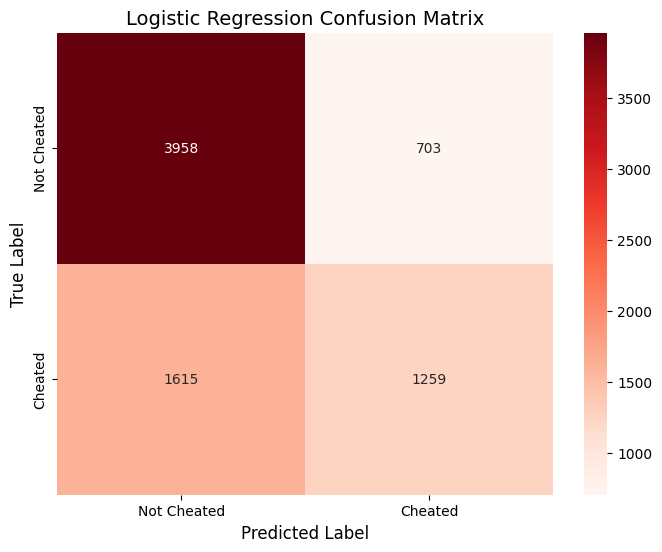

In [ ]:
# Confusion Matrix
labels = ['Not Cheated', 'Cheated']

# Plot heatmap
plt.figure(figsize=(8,6))
sns.heatmap(confusion_matrix(y_test, y_pred_logreg), annot=True, fmt='d', cmap='Reds',
            xticklabels=labels, yticklabels=labels)
plt.title('Logistic Regression Confusion Matrix', fontsize=14)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

#### XGBoost

In [ ]:
param_xg = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

xg = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    enable_categorical=True,
    eval_metric='logloss'
)

grid_xg = GridSearchCV(xg, param_xg, cv = cv, scoring = 'neg_brier_score', n_jobs=-1)

In [ ]:
xg_train_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
start_time = time.time()
xg_train_tracker.start()

grid_xg.fit(X_train, y_train)

xg_train_tracker.stop()
end_time = time.time()
training_time = end_time - start_time

xg_train_data = xg_train_tracker.final_emissions_data

print(f'Energy Consumed: {xg_train_data.energy_consumed:} kWH')
print(f'CO2 Emissions: {xg_train_data.emissions:} kg CO2eq')
print(f'Time to Train: {training_time}')

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[15:37:06] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




Energy Consumed: 0.016588210700336153 kWH
CO2 Emissions: 0.003625095561148767 kg CO2eq
Time to Train: 1137.601502418518


In [ ]:
xg_pred_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
xg_pred_tracker.start()

y_pred_xg = grid_xg.predict(X_test)

xg_pred_tracker.stop()
xg_pred_data = xg_pred_tracker.final_emissions_data
print(f'Energy Consumed: {xg_pred_data.energy_consumed:} kWH')
print(f'CO2 Emissions: {xg_pred_data.emissions:} kg CO2eq')

Energy Consumed: 5.199816451424668e-07 kWH
CO2 Emissions: 1.1363390468910498e-07 kg CO2eq


In [ ]:
best_xg = grid_xg.best_estimator_
results = pd.DataFrame(grid_xg.cv_results_)

# Show key columns
results = results[['params', 'mean_test_score', 'std_test_score', 'rank_test_score']]
results = results.sort_values(by='rank_test_score')
results['variance_test_score'] = results['std_test_score']**2

best_params = grid_xg.best_params_
best_index = grid_xg.best_index_

best_mean = results.iloc[best_index]['mean_test_score']
best_var = results.iloc[best_index]['variance_test_score']

print(f"Best Parameters: {best_params}")
print(f"Mean CV Score: {best_mean:}")
print(f"Variance of CV Score: {best_var:}")

Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.7}
Mean CV Score: -0.19310128507285654
Variance of CV Score: 1.290023069908361e-06


In [ ]:
# Performance Metric Evaluation
print(f'Accuracy: {accuracy_score(y_test, y_pred_xg):.6f}')
print(f"Precision: {precision_score(y_test, y_pred_xg, average='weighted'):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_xg, average='weighted'):.4f}")
print(f"F1: {f1_score(y_test, y_pred_xg, average='weighted'):.4f}")

y_prob_xg = grid_xg.predict_proba(X_test)  # Probabilities for all classes

# Calculate Brier Score Loss for each class and average
brier_scores = []
for i, class_label in enumerate(best_xg.classes_):
    # Create binary true labels for the current class
    y_true_binary = (y_test == class_label).astype(int)
    # Get predicted probabilities for the current class
    y_prob_class = y_prob_xg[:, i]
    score = brier_score_loss(y_true_binary, y_prob_class)
    brier_scores.append(score)

mean_brier_score = np.mean(brier_scores)
print(f"Mean Brier Score Loss: {mean_brier_score:}")

logloss = log_loss(y_test, y_prob_xg)
print("Log Loss:", logloss)

Accuracy: 0.699005
Precision: 0.6912
Recall: 0.6990
F1: 0.6889
Mean Brier Score Loss: 0.19200312118039997
Log Loss: 0.5650585109655186


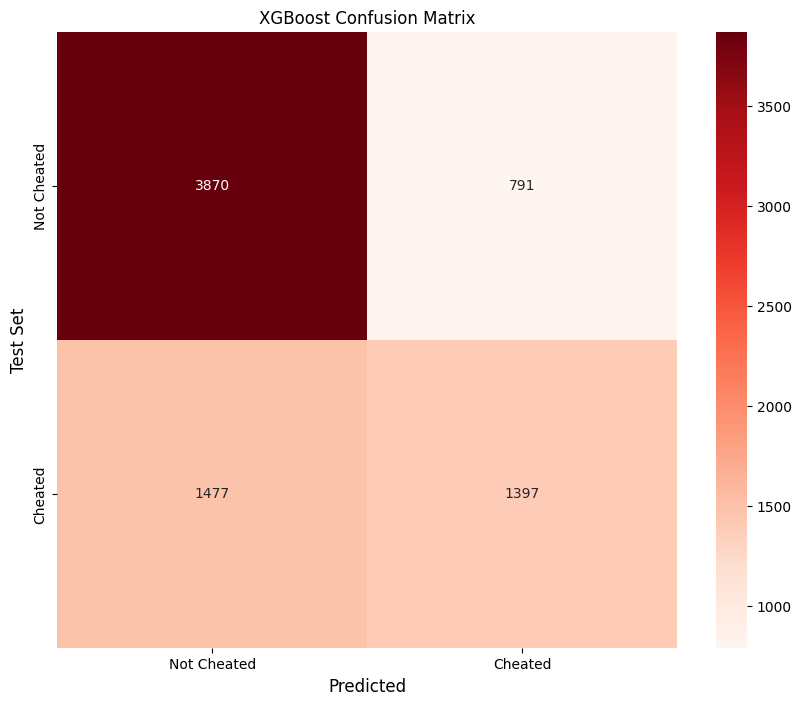

In [ ]:
# Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_test, y_pred_xg), xticklabels=['Not Cheated', 'Cheated'],
            yticklabels=['Not Cheated', 'Cheated'], annot=True, fmt='d', cmap='Reds')
plt.xlabel("Predicted", fontsize=12)
plt.ylabel("Test Set", fontsize=12)
plt.title("XGBoost Confusion Matrix")
plt.show()

#### Analysis

##### Logistic Regression

In [ ]:
# get feature names from one-hot encoder
ohe = preprocessor.named_transformers_['cat']
encoded_cols = ohe.get_feature_names_out(preprocessor.transformers_[0][2])

# combine with numerical columns
feature_names = np.concatenate([encoded_cols, preprocessor.transformers_[1][2]])

best_logreg = grid_logreg.best_estimator_
coefs = best_logreg.coef_[0]

coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefs
})
coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values('Abs_Coefficient', ascending=False)

print("Top 5 Most Important Features:")
print(coef_df.head(5))

print("\nLeast Important Features:")
print(coef_df.tail(5))

Top 5 Most Important Features:
                Feature  Coefficient  Abs_Coefficient
0       Age_Bucket_0-25    -0.251636         0.251636
15           soi_behave     0.188826         0.188826
13  Relationship_status    -0.187615         0.187615
11         infmoral_sex    -0.162690         0.162690
3      Age_Bucket_56-90     0.120818         0.120818

Least Important Features:
                Feature  Coefficient  Abs_Coefficient
1      Age_Bucket_26-40     0.009677         0.009677
9               jealemo     0.005641         0.005641
25  Individualism_col_4    -0.005562         0.005562
22  Individualism_col_1    -0.003633         0.003633
23  Individualism_col_2     0.002910         0.002910


In [ ]:
# Feature Coefficient & Odds Ratio Table
best_logreg = grid_logreg.best_estimator_

coefs = best_logreg.coef_[0]

# Get feature names from your preprocessing pipeline
feature_names = list(np.concatenate([
    encoded_cols,                      # one-hot encoded categorical features
    preprocessor.transformers_[1][2]   # numerical feature names
]))

# Build coefficient table
coef_table = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefs
})

# Add absolute coefficient and odds ratio
coef_table["Abs_Coefficient"] = np.abs(coef_table["Coefficient"])
coef_table["Odds_Ratio"] = np.exp(coef_table["Coefficient"])

# Sort by importance
coef_table = coef_table.sort_values(by="Abs_Coefficient", ascending=False)

print(coef_table)

                Feature  Coefficient  Abs_Coefficient  Odds_Ratio
0       Age_Bucket_0-25    -0.251636         0.251636    0.777528
15           soi_behave     0.188826         0.188826    1.207831
13  Relationship_status    -0.187615         0.187615    0.828934
11         infmoral_sex    -0.162690         0.162690    0.849854
3      Age_Bucket_56-90     0.120818         0.120818    1.128419
2      Age_Bucket_41-55     0.109636         0.109636    1.115872
17           soi_desire     0.092325         0.092325    1.096721
12         infmoral_emo    -0.085162         0.085162    0.918363
14                  qoa     0.067584         0.067584    1.069920
16         soi_attitude     0.061056         0.061056    1.062959
27         self_physatt     0.051765         0.051765    1.053128
20    Gender_Equality_3     0.051690         0.051690    1.053049
18    Gender_Equality_1    -0.048790         0.048790    0.952381
7         Religion_type    -0.041554         0.041554    0.959297
5         

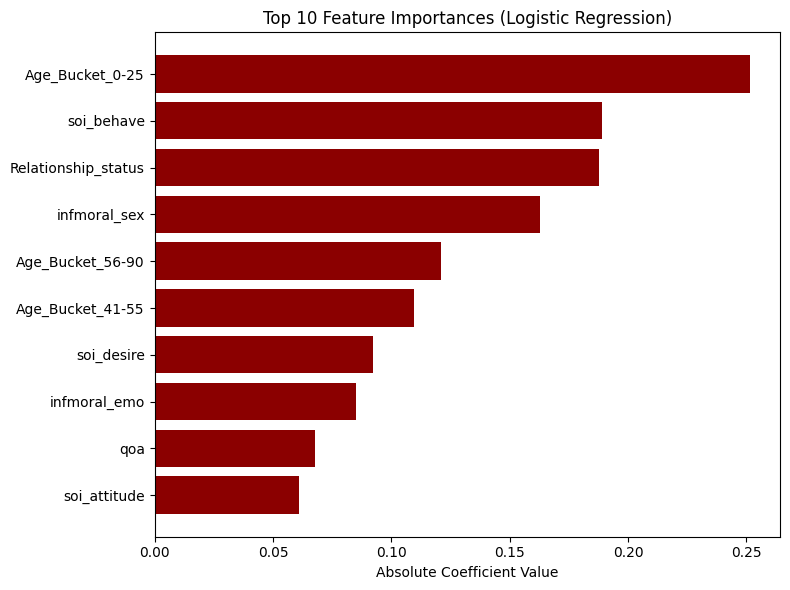

In [ ]:
# Top 10 Feature Importance Plot
top10 = coef_table.head(10)

plt.figure(figsize=(8, 6))
plt.barh(
    top10["Feature"][::-1],
    top10["Abs_Coefficient"][::-1],
    color="darkred"
)
plt.xlabel("Absolute Coefficient Value")
plt.title("Top 10 Feature Importances (Logistic Regression)")
plt.tight_layout()
plt.show()

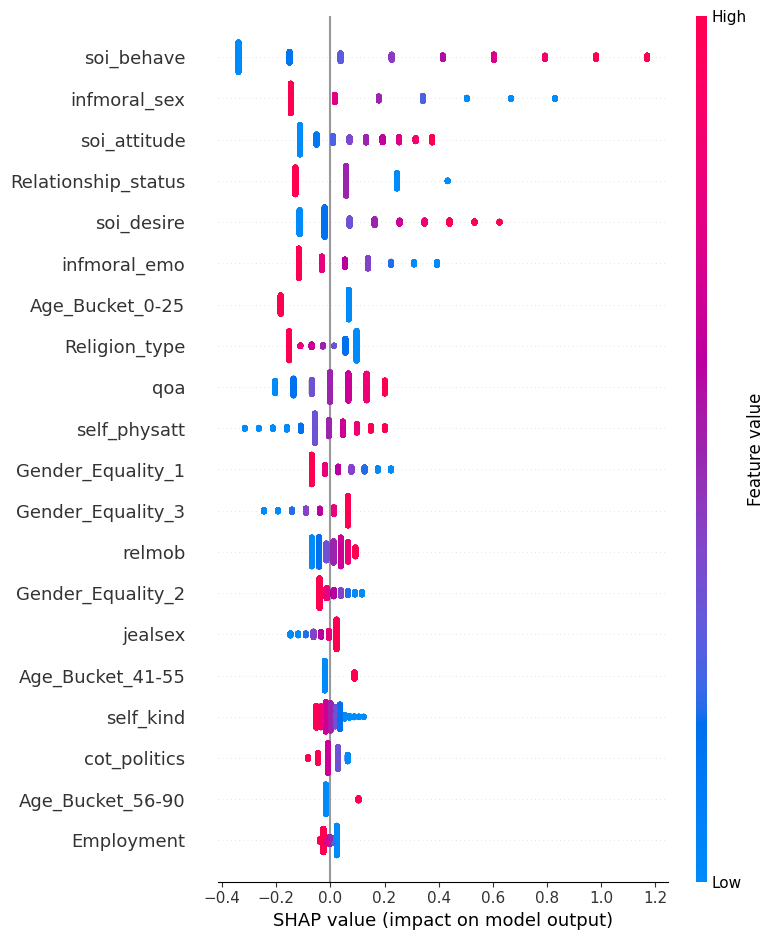

In [ ]:
# SHAP Summary Plot
X_train_shap = X_train.toarray() if hasattr(X_train, "toarray") else X_train
X_test_shap  = X_test.toarray()  if hasattr(X_test, "toarray")  else X_test

feature_names = np.concatenate([encoded_cols, preprocessor.transformers_[1][2]])

best_logreg = grid_logreg.best_estimator_

explainer = shap.LinearExplainer(best_logreg, X_train_shap)
shap_values = explainer.shap_values(X_test_shap)

shap.summary_plot(shap_values, X_test_shap, feature_names=feature_names)

##### XGBoost

In [ ]:
# Feature Importance
importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": best_xg.feature_importances_
}).sort_values("importance", ascending=False)
print(importance_df)

                feature  importance
15           soi_behave    0.260559
11         infmoral_sex    0.080223
16         soi_attitude    0.056419
17           soi_desire    0.053407
12         infmoral_emo    0.043279
0       Age_Bucket_0-25    0.035010
14                  qoa    0.026935
13  Relationship_status    0.026778
1      Age_Bucket_26-40    0.025124
7         Religion_type    0.024987
2      Age_Bucket_41-55    0.023975
27         self_physatt    0.023207
3      Age_Bucket_56-90    0.022184
18    Gender_Equality_1    0.021895
20    Gender_Equality_3    0.021314
19    Gender_Equality_2    0.021298
25  Individualism_col_4    0.021250
23  Individualism_col_2    0.020354
21               relmob    0.020335
6             cot_class    0.020166
5          cot_politics    0.019636
8            Employment    0.019583
26            self_kind    0.019501
4              cot_educ    0.019190
10              jealsex    0.018636
9               jealemo    0.018577
22  Individualism_col_1    0

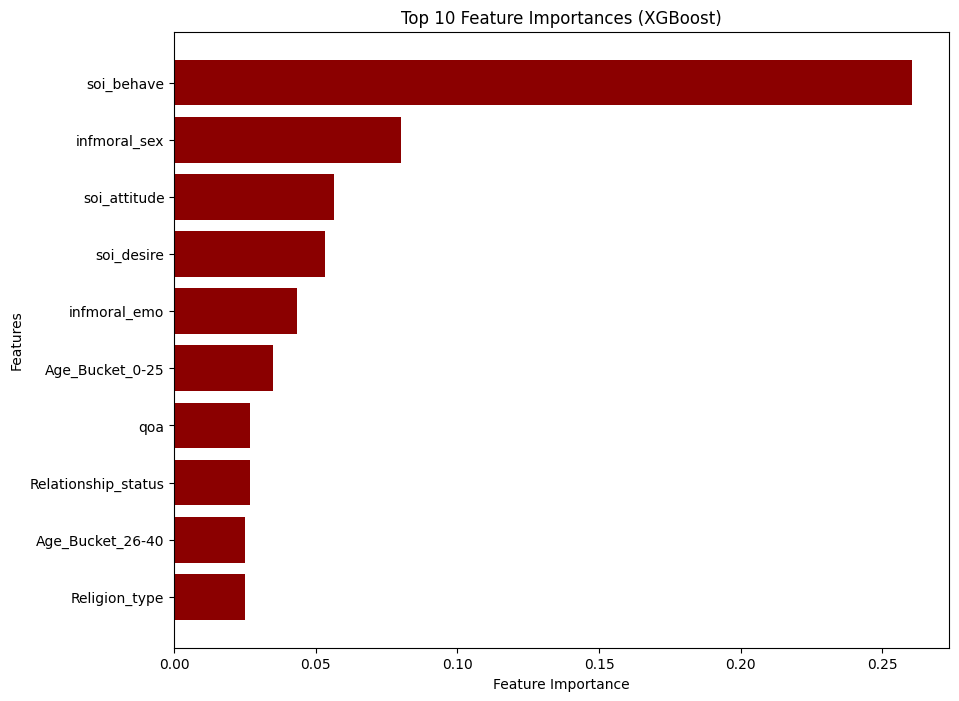

In [ ]:
# Top 10 Feature Importance Graph
topf = importance_df.sort_values("importance", ascending=False).head(10)

top_features = topf["feature"]
top_values = topf["importance"]

plt.figure(figsize=(10, 8))
plt.barh(top_features, top_values, color = 'darkred')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Top 10 Feature Importances (XGBoost)")
plt.gca().invert_yaxis()
plt.show()

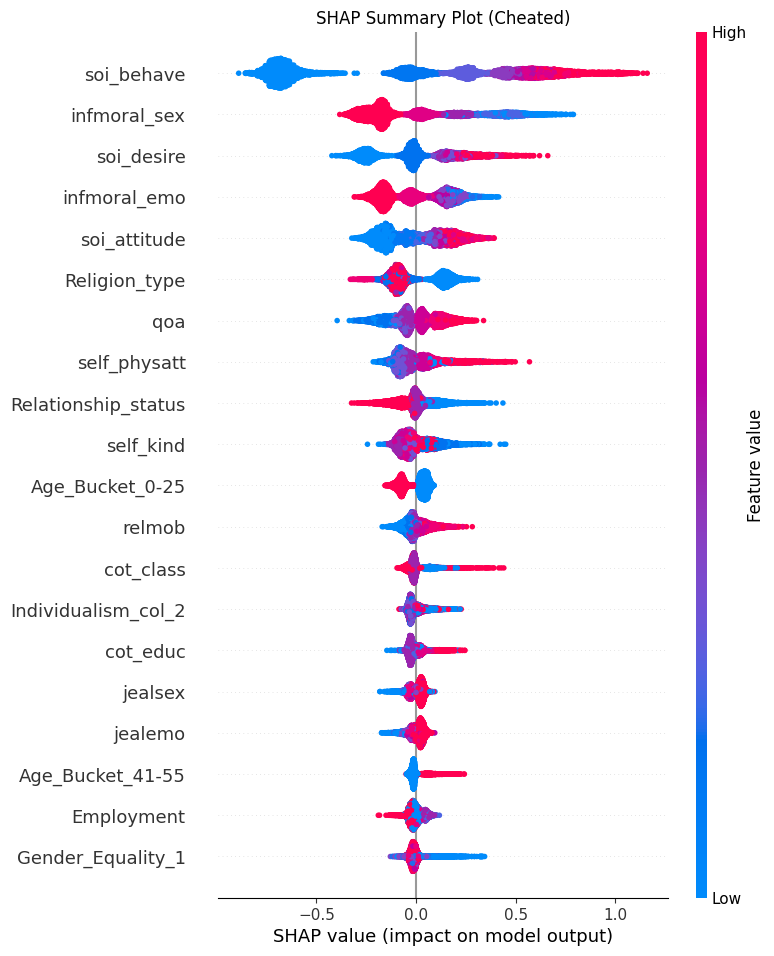

In [ ]:
# SHAP Summary Plots
explainer = shap.TreeExplainer(best_xg)
shap_values = explainer(X_test)

feature_names = preprocessor.get_feature_names_out()
feature_names = [f.split("__", 1)[1] for f in feature_names]

shap.summary_plot(
    shap_values.values,
    X_test,
    feature_names=feature_names,
    show=False
)

plt.title("SHAP Summary Plot (Cheated)")
plt.show()

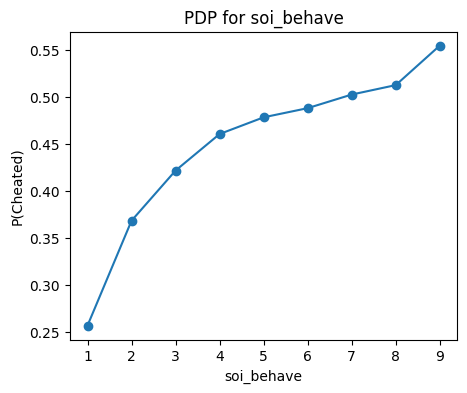

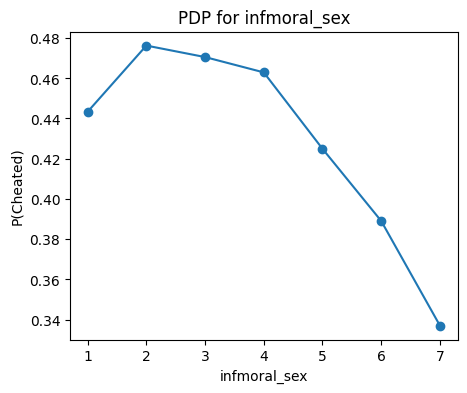

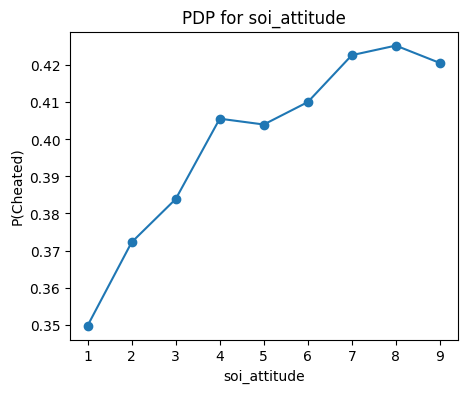

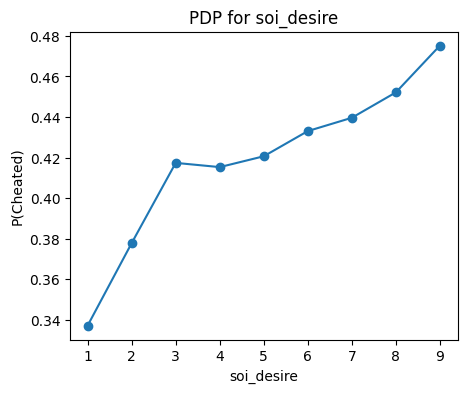

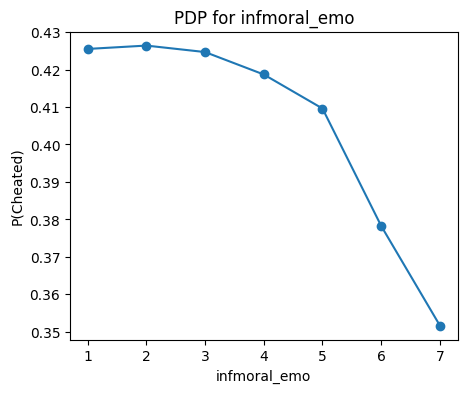

...

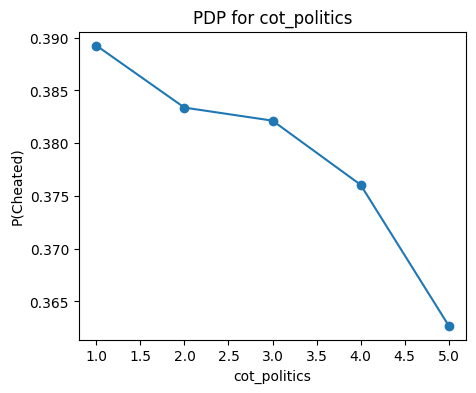

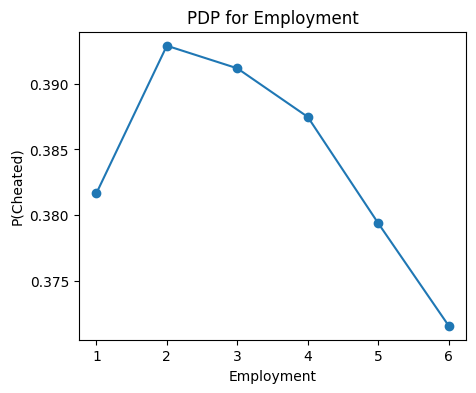

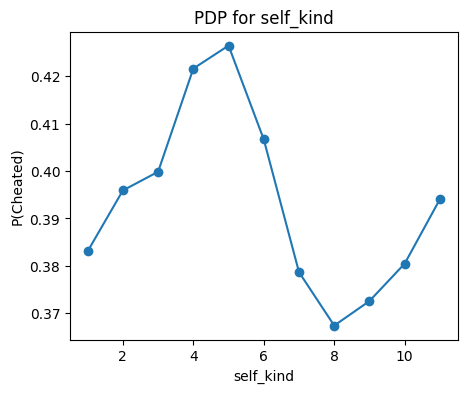

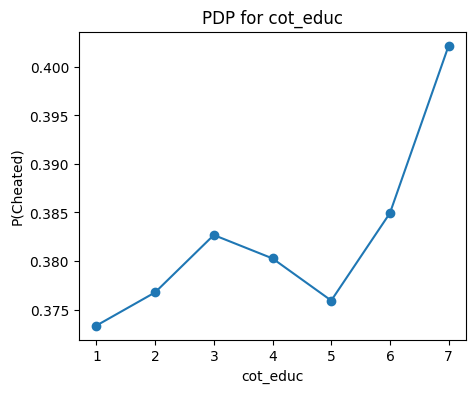

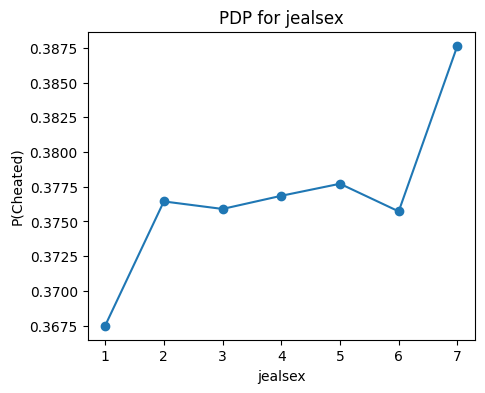

In [ ]:
# Partial Dependency Plots
# Map feature names to indices
feature_to_idx = {name: i for i, name in enumerate(feature_names)}

def manual_pdp(model, X, feature_idx):
    values = np.unique(X[:, feature_idx])
    pdp_vals = []

    for v in values:
        X_temp = X.copy()
        X_temp[:, feature_idx] = v
        pdp_vals.append(model.predict_proba(X_temp)[:, 1].mean())

    return values, np.array(pdp_vals)


# Plot PDPs for top 25 most important features
top_features = importance_df.head(25)

for _, row in top_features.iterrows():
    feature_name = row["feature"]
    feature_idx = feature_to_idx[feature_name]

    x_vals, y_vals = manual_pdp(best_xg, X_test, feature_idx)

    plt.figure(figsize=(5, 4))
    plt.plot(x_vals, y_vals, marker="o")
    plt.xlabel(feature_name)
    plt.ylabel("P(Cheated)")
    plt.title(f"PDP for {feature_name}")
    plt.show()

### Can relationship statuses be predicted?

#### Data PreProcessing

In [ ]:
columns_to_keep = ['Age', 'Employment_label', 'Religion_type_label',
                   'self_physatt', 'Sex_label', 'Sexual_Orientation_label', 'self_kind',
                   'self_resources', 'Gender_Equality_1', 'Gender_Equality_2',
                   'Gender_Equality_3', 'Relationship_status', "Individualism_col_1",
                   "Individualism_col_2", "Individualism_col_3", "Individualism_col_4",
                   "qoa", "soi_behave", "soi_attitude", "soi_desire", "relmob"]

data_1 = df[columns_to_keep]

In [ ]:
# Ensure X_1 has unique column names to prevent AttributeError when accessing .dtype
# This assumes that any duplicated columns are redundant and the first occurrence is sufficient.
data_1 = data_1.loc[:, ~data_1.columns.duplicated()]

In [ ]:
data_1['Relationship_status'].value_counts()

,count
Relationship_status,
2,15488
3,13913
1,7858
0,415


In [ ]:
X_1 = data_1.drop(['Relationship_status'], axis = 1)
y_1 = data_1['Relationship_status']

for col in X_1.columns:
  if X_1[col].dtype == 'category':
    X_1[col] = X_1[col].astype('object')

categorical_cols = [col for col in X_1.columns if X_1[col].dtype == 'object']
numerical_cols = [col for col in X_1.columns if X_1[col].dtype != 'object']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols),
        ('num', 'passthrough', numerical_cols)
    ]
)

In [ ]:
# Data split
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size = 0.2,
                                                    stratify = y_1, random_state = 42)

In [ ]:
X_train_1 = preprocessor.fit_transform(X_train_1)
X_test_1 = preprocessor.transform(X_test_1)

#### KNN

Best k: 49
Lowest Brier score: 0.12422246094651448


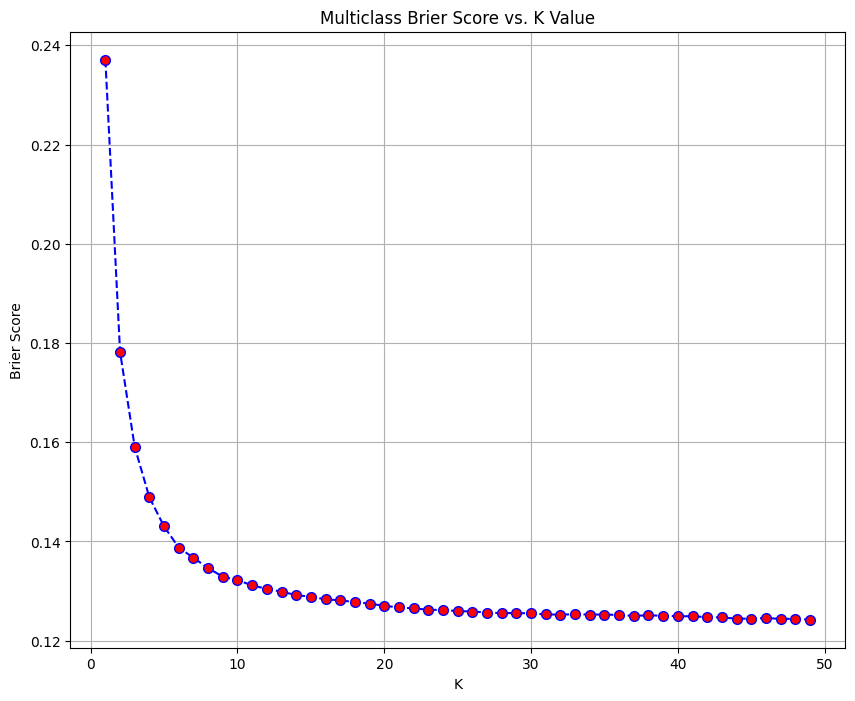

In [ ]:
brier_scores = []
k_values = range(1, 50)

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_1, y_train_1)

    # full probability matrix for multiclass
    y_prob = knn.predict_proba(X_test_1)

    # Calculate Brier Score Loss for each class and average
    brier_class_scores = []
    for i, class_label in enumerate(knn.classes_):
        # Create binary true labels for the current class
        y_true_binary = (y_test_1 == class_label).astype(int)
        # Get predicted probabilities for the current class
        y_prob_class = y_prob[:, i]
        score = brier_score_loss(y_true_binary, y_prob_class)
        brier_class_scores.append(score)

    mean_brier_score = np.mean(brier_class_scores)
    brier_scores.append(mean_brier_score)

best_k = k_values[np.argmin(brier_scores)]
best_brier = min(brier_scores)

print("Best k:", best_k)
print("Lowest Brier score:", best_brier)

plt.figure(figsize=(10, 8))
plt.plot(k_values, brier_scores, color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=7)
plt.title('Multiclass Brier Score vs. K Value')
plt.xlabel('K')
plt.ylabel('Brier Score')
plt.grid(True)
plt.show()

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=best_k)

# Energy Tracking: Training
knn_train_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
start_time = time.time()
knn_train_tracker.start()

knn_model.fit(X_train_1, y_train_1)

knn_train_tracker.stop()
end_time = time.time()
training_time = end_time - start_time

knn_train_data = knn_train_tracker.final_emissions_data
print(f'Energy Consumed: {knn_train_data.energy_consumed} kWH')
print(f'CO2 Emissions: {knn_train_data.emissions} kg CO2eq')
print(f'Training Time: {training_time}')

Energy Consumed: 6.521223819283428e-08 kWH
CO2 Emissions: 1.4251120839731622e-08 kg CO2eq
Training Time: 0.005311727523803711


In [ ]:
# Energy Tracking: Prediction
knn_pred_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
knn_pred_tracker.start()

y_pred_knn = knn_model.predict(X_test_1)

knn_pred_tracker.stop()
knn_pred_data = knn_pred_tracker.final_emissions_data
print(f'Energy Consumed: {knn_pred_data.energy_consumed} kWH')
print(f'CO2 Emissions: {knn_pred_data.emissions} kg CO2eq')

Energy Consumed: 5.521506192569442e-05 kWH
CO2 Emissions: 1.206639338692105e-05 kg CO2eq


In [ ]:
# Evaluation
print(f"Accuracy: {accuracy_score(y_test_1, y_pred_knn):.4f}")
print(f"F1: {f1_score(y_test_1, y_pred_knn, average='weighted'):.4f}")

y_prob_knn = knn_model.predict_proba(X_test_1)  # Probabilities for all classes
logloss = log_loss(y_test_1, y_prob_knn)
print("Log Loss:", logloss)

# Calculate Brier Score Loss for each class and average
brier_scores = []
for i, class_label in enumerate(knn_model.classes_):
    # Create binary true labels for the current class
    y_true_binary = (y_test_1 == class_label).astype(int)
    # Get predicted probabilities for the current class
    y_prob_class = y_prob_knn[:, i]
    score = brier_score_loss(y_true_binary, y_prob_class)
    brier_scores.append(score)

mean_brier_score = np.mean(brier_scores)
print(f"Mean Brier Score Loss: {mean_brier_score}")

Accuracy: 0.6183
F1: 0.5744
Log Loss: 0.9160636654630654
Mean Brier Score Loss: 0.12422246094651448


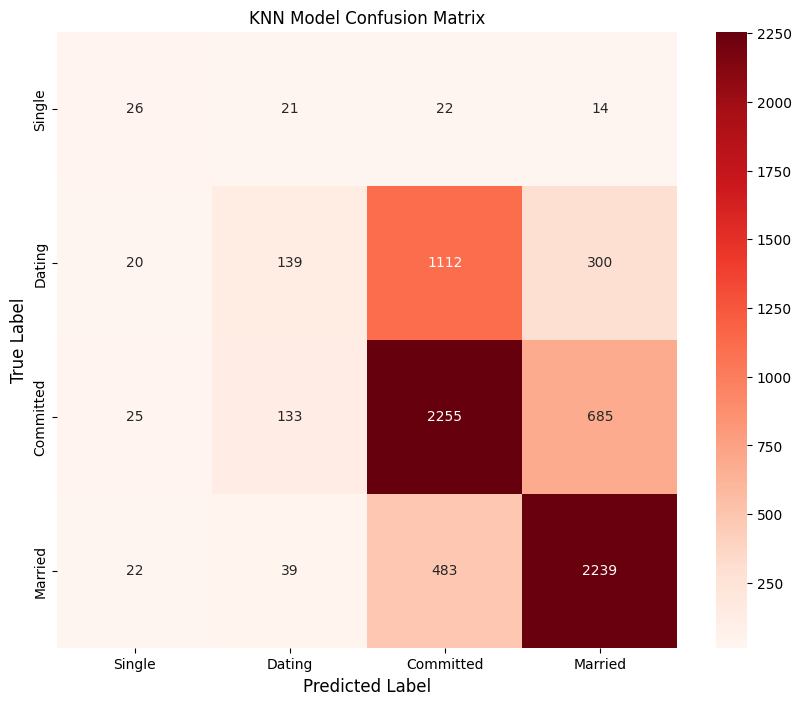

In [ ]:
labels = ['Single', 'Dating', "Committed", "Married"]

plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_test_1, y_pred_knn), annot=True, fmt='d', cmap='Reds',
            xticklabels = labels, yticklabels = labels)
plt.title('KNN Model Confusion Matrix')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

#### Random Forest

In [ ]:
# Cross Validation Strategy
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

In [ ]:
param_rf = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf = RandomForestClassifier(random_state = 42)
grid_rf = GridSearchCV(rf, param_rf, cv = cv, scoring = 'neg_brier_score', n_jobs=-1)

In [ ]:
# Energy Tracking: Training
rf_train_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
start_time = time.time()
rf_train_tracker.start()

grid_rf.fit(X_train_1, y_train_1)

rf_train_tracker.stop()
end_time = time.time()
training_time = end_time - start_time

rf_train_data = rf_train_tracker.final_emissions_data

print(f'Energy Consumed: {rf_train_data.energy_consumed} kWH')
print(f'CO2 Emissions: {rf_train_data.emissions} kg CO2eq')
print(f'Time to Train: {training_time}')

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]



Energy Consumed: 0.0074596352332603555 kWH
CO2 Emissions: 0.0016301873095531075 kg CO2eq
Time to Train: 511.57664370536804


In [ ]:
# Energy Tracking: Prediction
rf_pred_tracker = EmissionsTracker(measure_power_secs = 1, save_to_file = False,
                                     log_level = 'error')
rf_pred_tracker.start()

y_pred_rf = grid_rf.predict(X_test_1)

rf_pred_tracker.stop()
rf_pred_data = rf_pred_tracker.final_emissions_data
print(f'Energy Consumed: {rf_pred_data.energy_consumed} kWH')
print(f'CO2 Emissions: {rf_pred_data.emissions} kg CO2eq')

Energy Consumed: 3.2639445312484996e-06 kWH
CO2 Emissions: 7.13284334628385e-07 kg CO2eq


In [ ]:
# GridSearchCV Best Parameters
best_rf = grid_rf.best_estimator_
results = pd.DataFrame(grid_rf.cv_results_)

best_params = grid_rf.best_params_
best_index = grid_rf.best_index_

print(f"Best Parameters: {best_params}")

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
# Evaluation
print(f"Accuracy: {accuracy_score(y_test_1, y_pred_rf)}")
print(f"F1: {f1_score(y_test_1, y_pred_rf, average='weighted')}")

y_prob_rf = grid_rf.predict_proba(X_test_1)  # Probabilities for all classes
logloss = log_loss(y_test_1, y_prob_rf)
print("Log Loss:", logloss)

# Calculate Brier Score Loss for each class and average
brier_scores = []
for i, class_label in enumerate(best_rf.classes_):
    # Create binary true labels for the current class
    y_true_binary = (y_test_1 == class_label).astype(int)
    # Get predicted probabilities for the current class
    y_prob_class = y_prob_rf[:, i]
    score = brier_score_loss(y_true_binary, y_prob_class)
    brier_scores.append(score)

mean_brier_score = np.mean(brier_scores)
print(f"Mean Brier Score Loss: {mean_brier_score}")

Accuracy: 0.6337093563370936
F1: 0.600291715597901
Log Loss: 0.8241993595280209
Mean Brier Score Loss: 0.1202612209688122


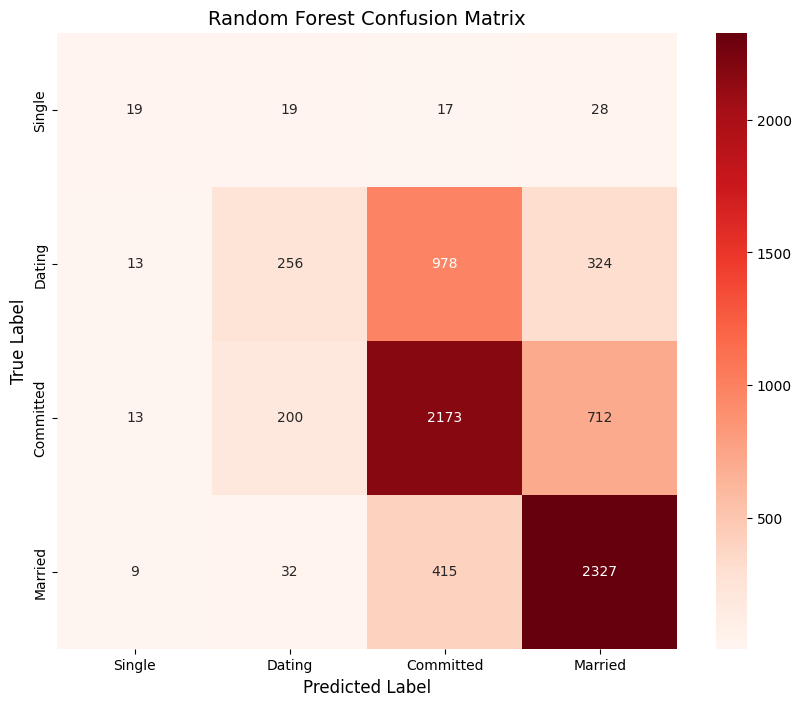

In [ ]:
labels = ['Single', 'Dating', "Committed", "Married"]

plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_test_1, y_pred_rf), annot=True, fmt='d', cmap='Reds',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Random Forest Confusion Matrix', fontsize=14)
plt.show()

#### Analysis

##### KNN

  0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipython-input-823822739.py:33: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



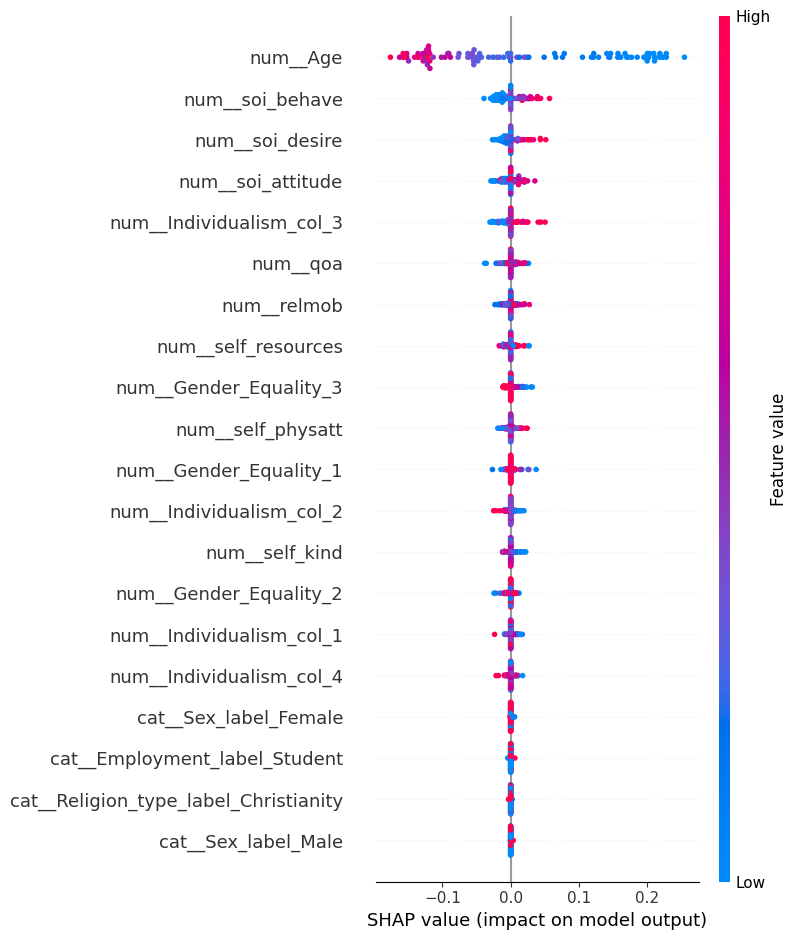

In [105]:
# SHAP Summary

# Kernel SHAP needs a small background sample
background = shap.sample(X_train_1, 100, random_state=0)

explainer = shap.KernelExplainer(
    knn_model.predict_proba,
    background
)

num_samples = 100

if X_test_1.shape[0] < num_samples:
    num_samples = X_test_1.shape[0]

np.random.seed(0)
random_indices = np.random.choice(
    X_test_1.shape[0],
    num_samples,
    replace=False
)

X_sample = X_test_1[random_indices]

# Output shape: (n_samples, n_features, n_classes)
shap_values = explainer(X_sample)

# Select positive class (class 1)
shap_values_class1 = shap_values[..., 1]

feature_names = preprocessor.get_feature_names_out()

Model predicted classes: [0 1 2 3]
Class: Single


/tmp/ipython-input-3474865874.py:20: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



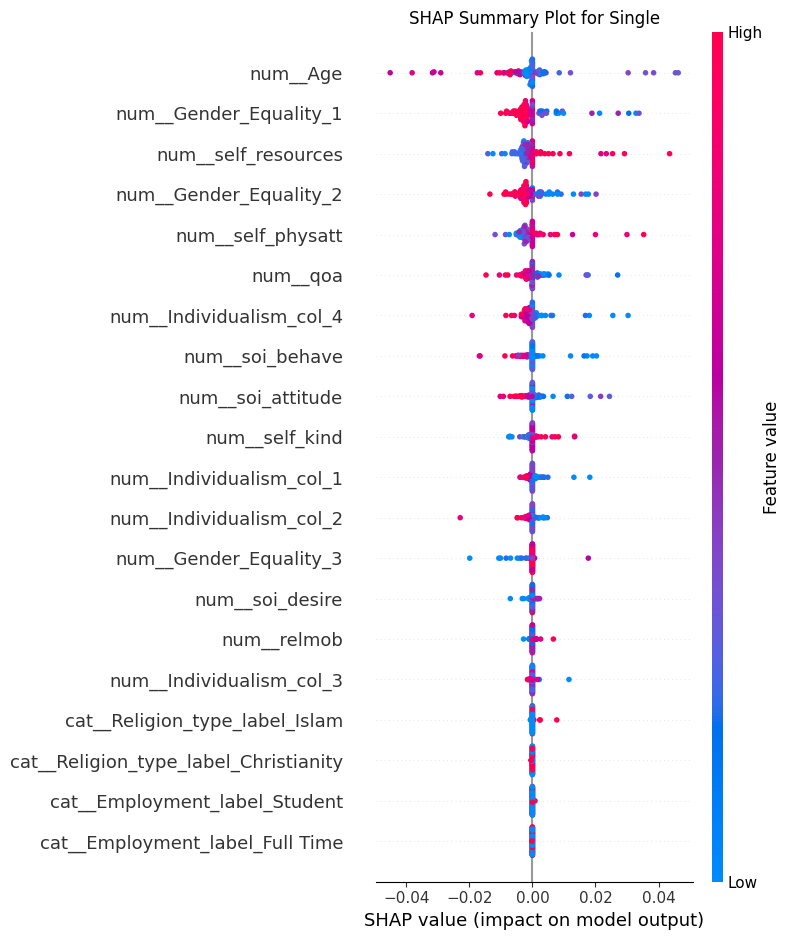

Class: Dating


/tmp/ipython-input-3474865874.py:20: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



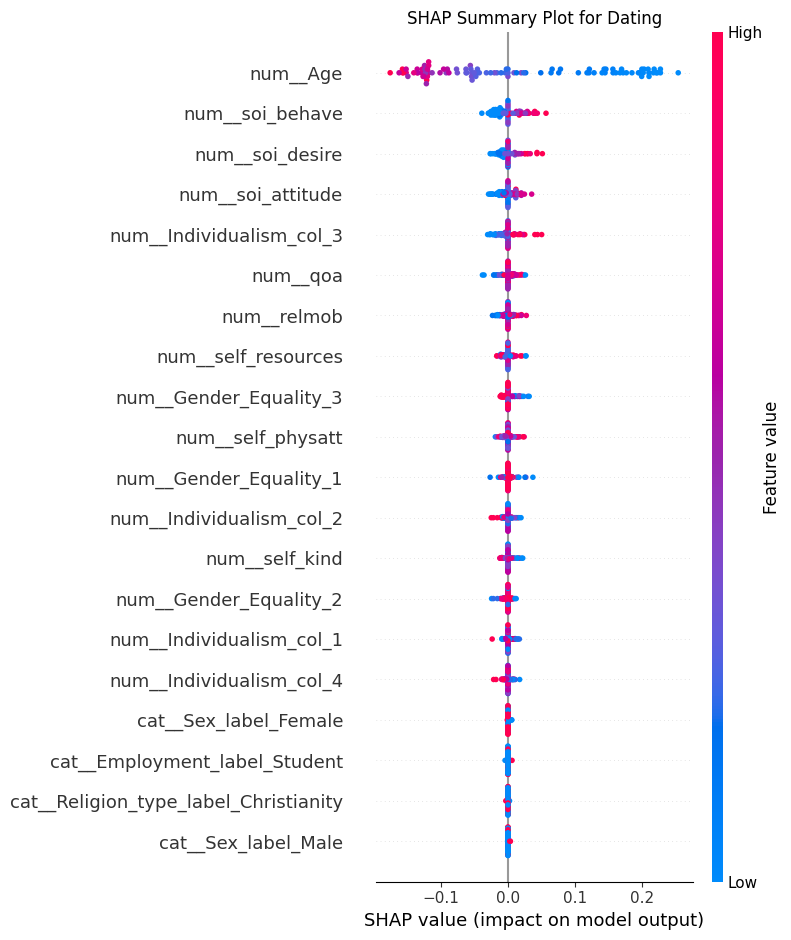

Class: Committed


/tmp/ipython-input-3474865874.py:20: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



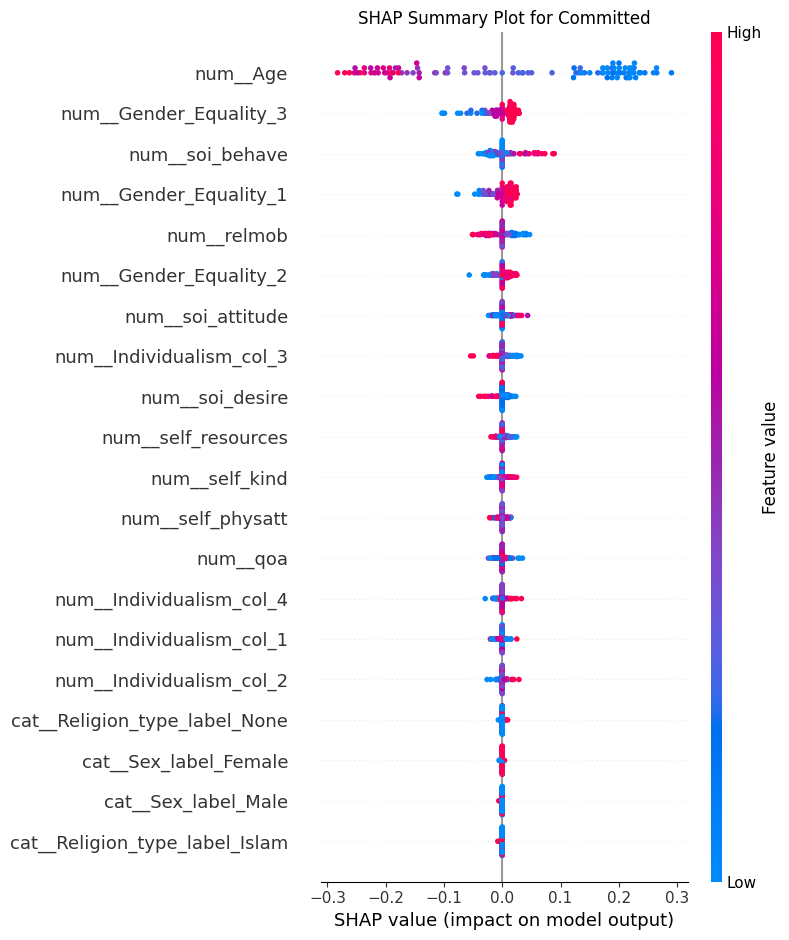

Class: Married


/tmp/ipython-input-3474865874.py:20: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



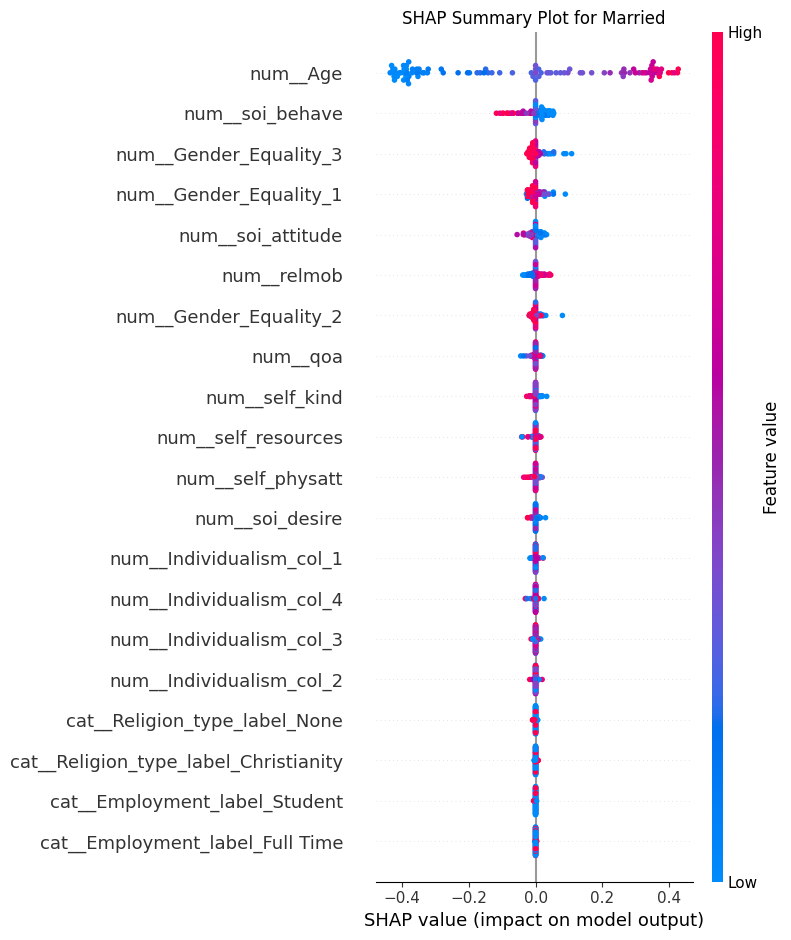

In [106]:
class_names = {
    0: "Single",
    1: "Dating",
    2: "Committed",
    3: "Married"
}

# Get the actual class labels used by the model
predicted_classes = knn_model.classes_
print(f"Model predicted classes: {predicted_classes}")

# Loop over class index positions
for i, class_idx in enumerate(predicted_classes):
    class_label = class_names[class_idx]
    print("Class:", class_label)

    # SHAP values for class i (NOT class_idx)
    shap_values_class_i = shap_values[:, :, i]

    shap.summary_plot(
        shap_values_class_i,
        X_sample,
        feature_names=feature_names,
        show=False
    )

    plt.title(f"SHAP Summary Plot for {class_label}")
    plt.tight_layout()
    plt.show()

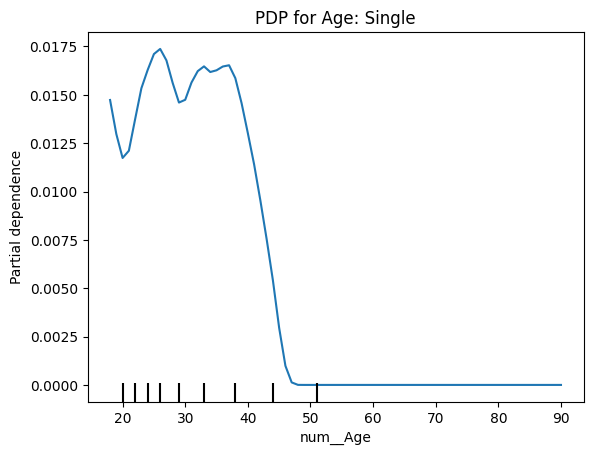

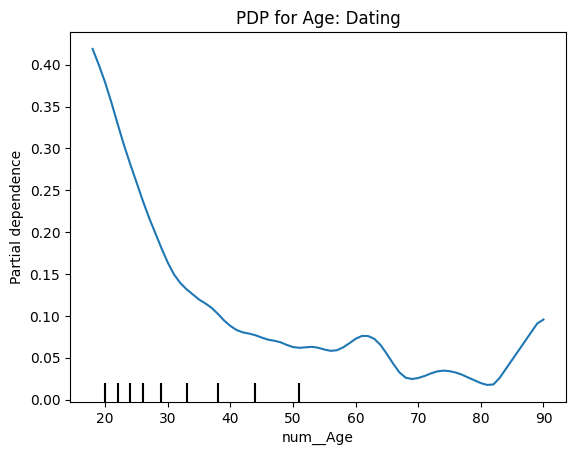

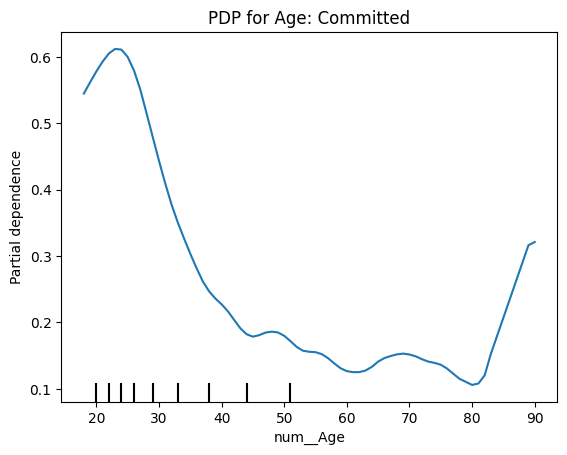

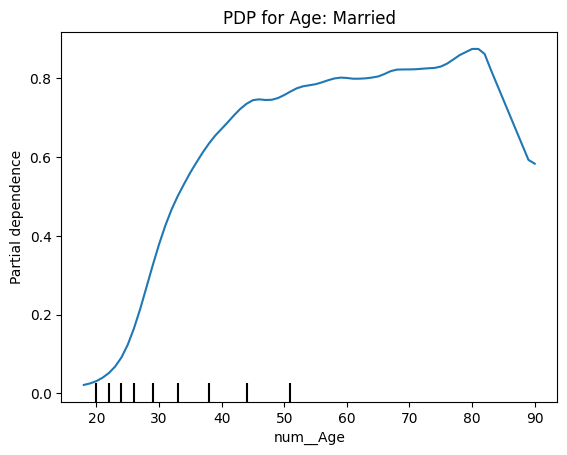

In [107]:
# Partial Dependence Plots - num_Age
for t in knn_model.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=knn_model,
        X=X_test_1,
        features=["num__Age"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for Age: {class_names[t]}")
    plt.show()

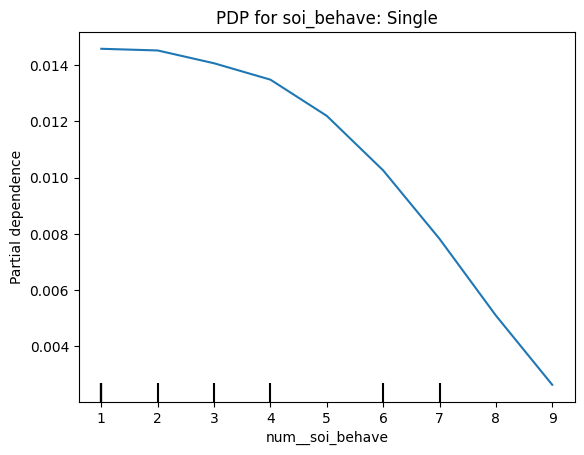

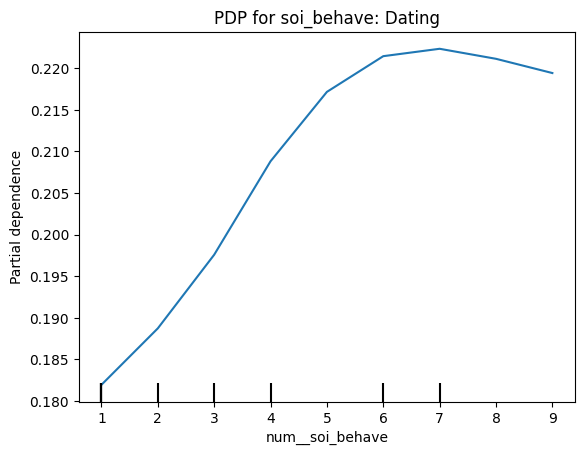

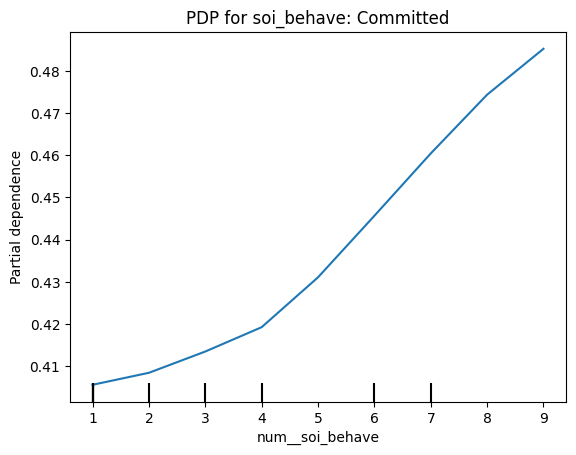

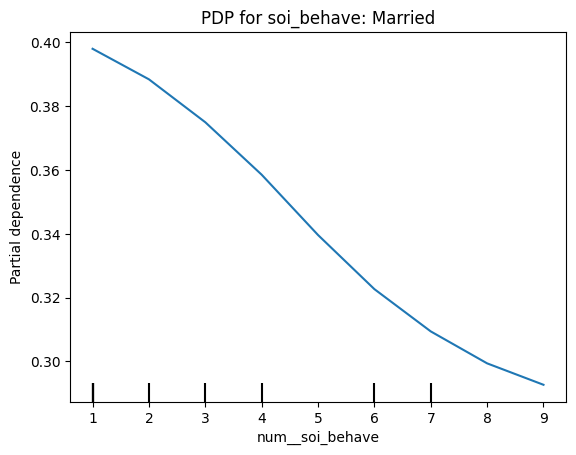

In [109]:
# Partial Dependence Plots - num__soi_behave
for t in knn_model.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=knn_model,
        X=X_test_1,
        features=["num__soi_behave"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for soi_behave: {class_names[t]}")
    plt.show()

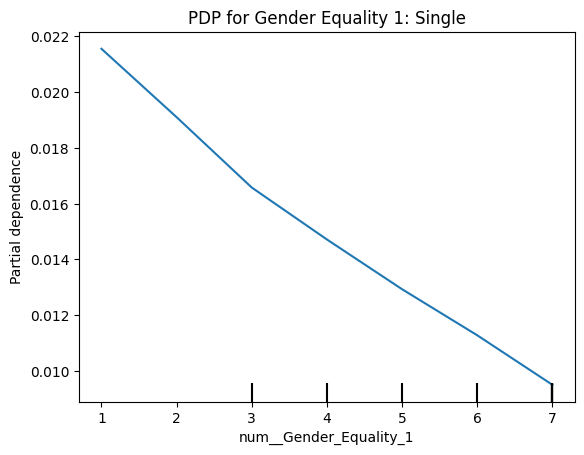

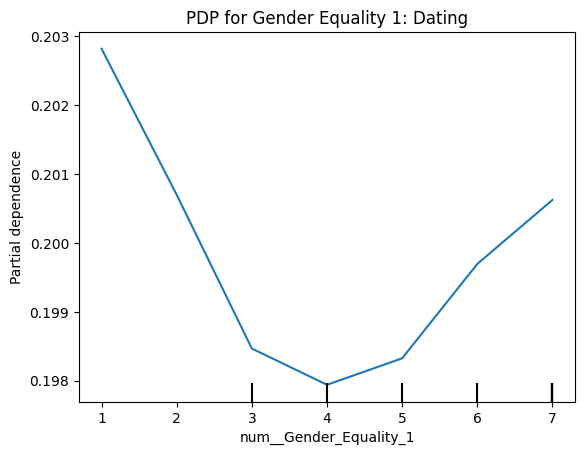

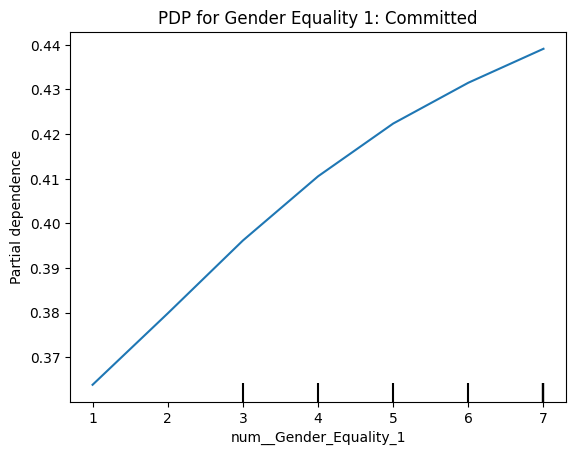

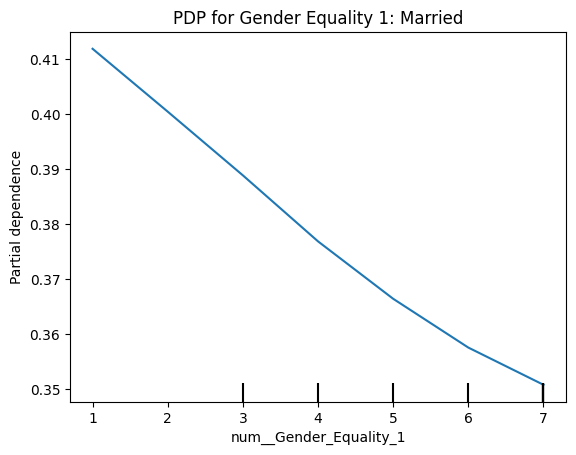

In [110]:
# Partial Dependence Plots - num__Gender_Equality_1
for t in knn_model.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=knn_model,
        X=X_test_1,
        features=["num__Gender_Equality_1"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for Gender Equality 1: {class_names[t]}")
    plt.show()

##### Random Forest

In [111]:
# Feature Importance
feature_names = preprocessor.get_feature_names_out()
feature_importances = best_rf.feature_importances_
importance_series = pd.Series(feature_importances, index=feature_names)
sorted_importance = importance_series.sort_values(ascending=False)
print(sorted_importance)

num__Age                                   0.197403
num__self_resources                        0.049467
num__self_kind                             0.048196
num__qoa                                   0.046843
num__self_physatt                          0.046749
num__soi_behave                            0.045988
num__relmob                                0.045820
num__Individualism_col_4                   0.043898
cat__Employment_label_Student              0.043291
num__soi_attitude                          0.042572
num__Individualism_col_1                   0.042558
num__Individualism_col_3                   0.041924
num__Individualism_col_2                   0.041768
num__soi_desire                            0.039913
num__Gender_Equality_1                     0.033106
num__Gender_Equality_2                     0.032370
num__Gender_Equality_3                     0.029410
cat__Employment_label_Full Time            0.016825
cat__Religion_type_label_None              0.012159
cat__Religio

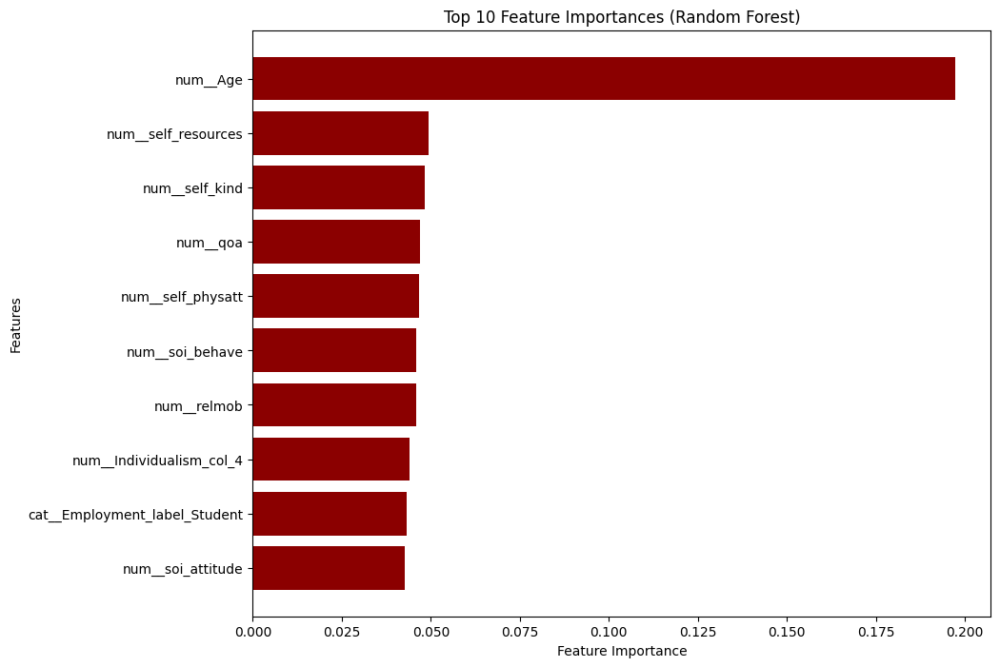

In [112]:
top_features = sorted_importance.head(10).index.tolist()
top_values = sorted_importance.head(10).values

plt.figure(figsize=(10, 8))
plt.barh(top_features, top_values, color='darkred')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Top 10 Feature Importances (Random Forest)')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# SHAP Summary
explainer = shap.TreeExplainer(best_rf)

num_samples = 1000
# Ensure we don't try to sample more rows than available in X_test_1
if X_test_1.shape[0] < num_samples:
    num_samples = X_test_1.shape[0]

# Generate random indices for sampling
np.random.seed(0)
random_indices = np.random.choice(X_test_1.shape[0], num_samples, replace=False)
X_sample = X_test_1[random_indices]

shap_values = explainer(X_sample)

# Correct way to get feature names after preprocessing
feature_names = preprocessor.get_feature_names_out()

Model predicted classes: [0 1 2 3]
Class: Single


/tmp/ipython-input-4116508211.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i],


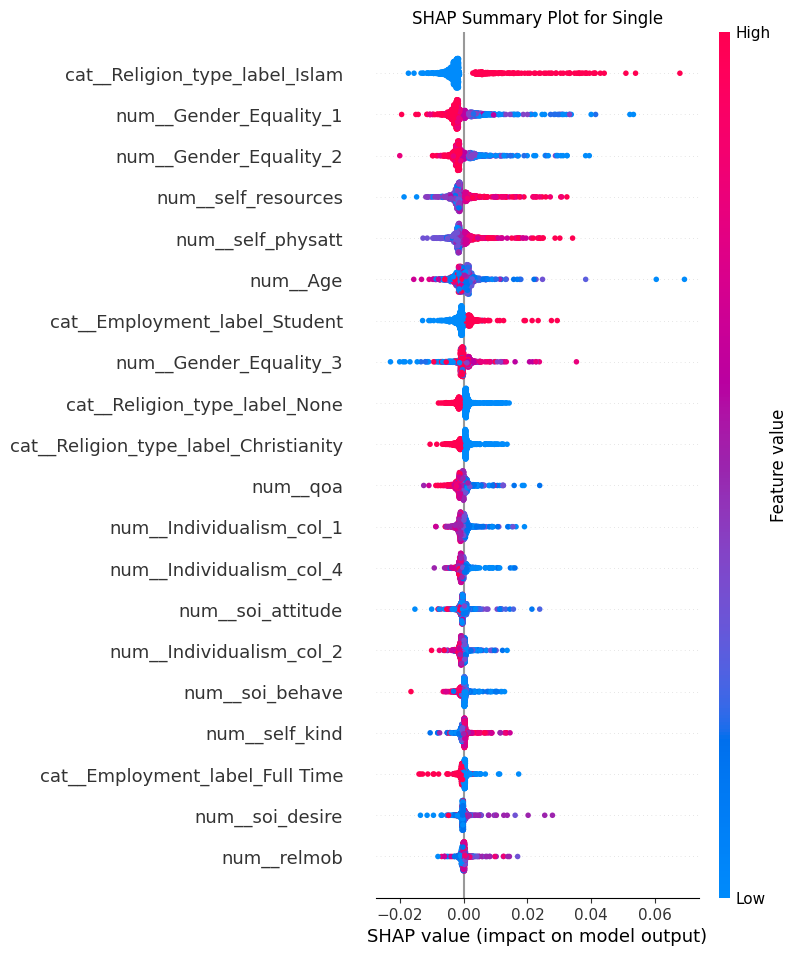

Class: Dating


/tmp/ipython-input-4116508211.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i],


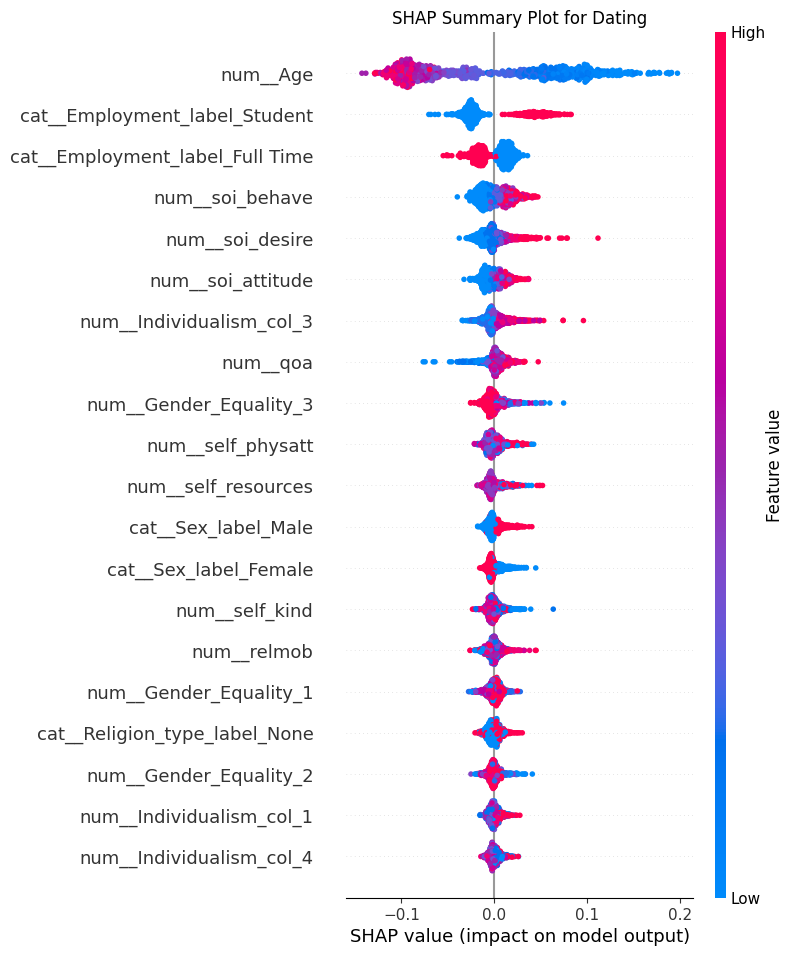

Class: Committed


/tmp/ipython-input-4116508211.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i],


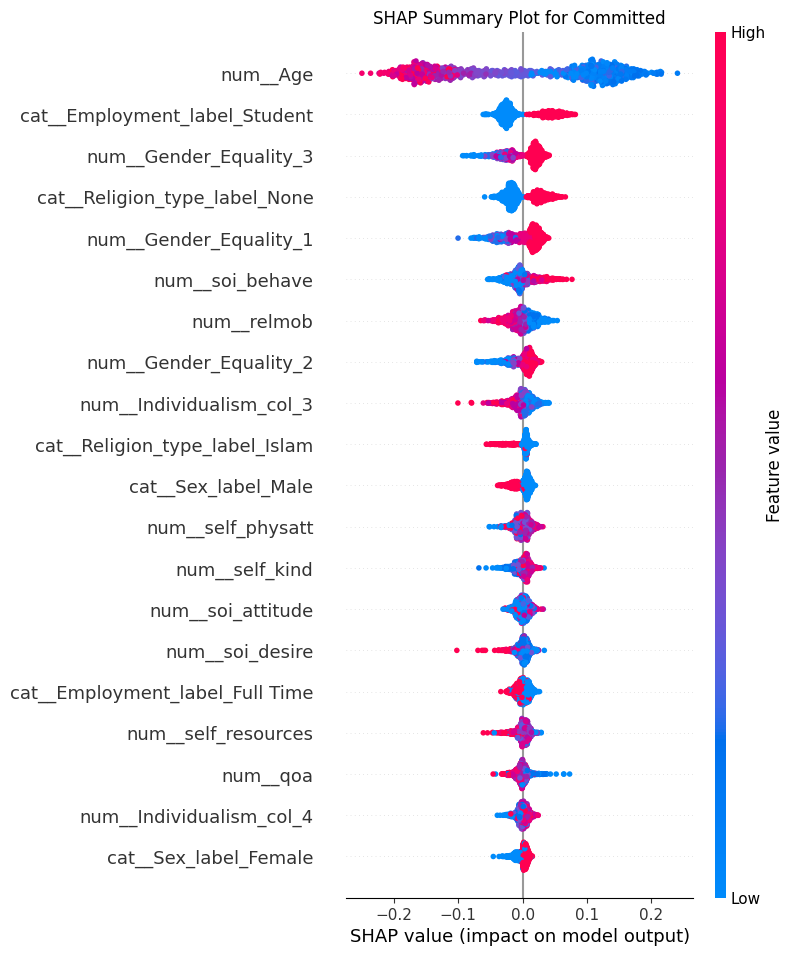

Class: Married


/tmp/ipython-input-4116508211.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, i],


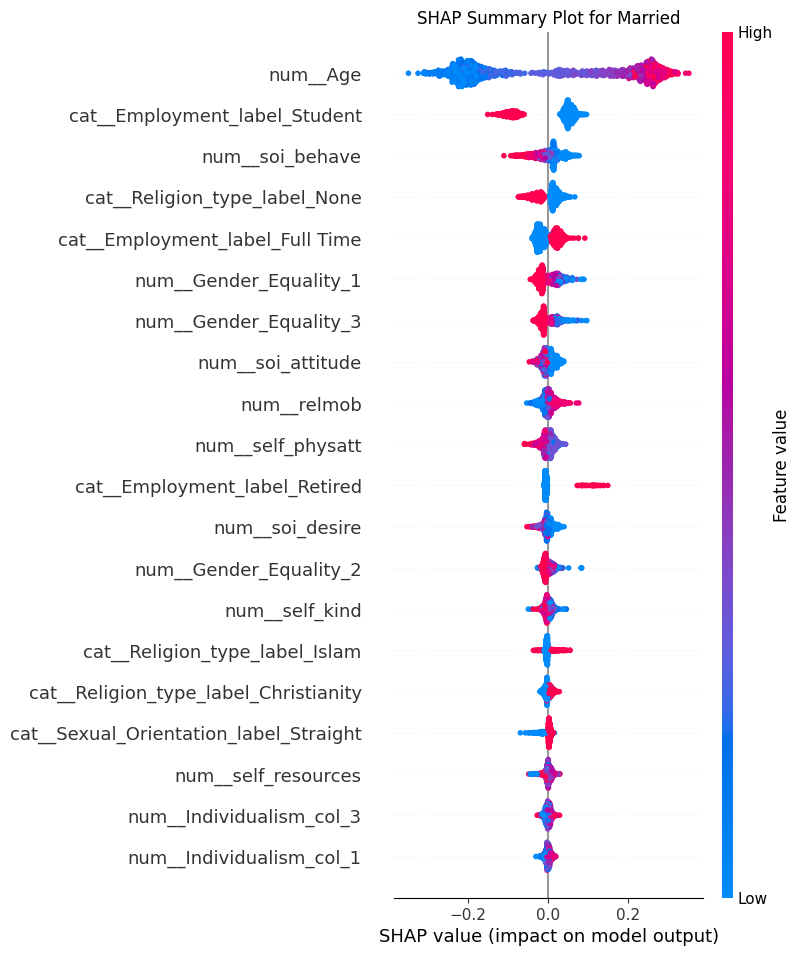

In [ ]:
class_names = {
    0: "Single",
    1: "Dating",
    2: "Committed",
    3: "Married"
}

# Get the actual classes predicted by the model
predicted_classes = best_rf.classes_
print(f"Model predicted classes: {predicted_classes}")

for i, class_idx in enumerate(predicted_classes):
    class_label = class_names[class_idx]
    print("Class:", class_label)

    # Select SHAP values for the current class_idx. The 'i' here is the index within predicted_classes.
    shap.summary_plot(shap_values[:, :, i],
                      X_sample, # Use X_sample, which shap_values was computed for
                      feature_names=feature_names,
                      show=False # Prevent immediate display to customize title
                     )
    plt.title(f"SHAP Summary Plot for {class_label}")
    plt.show()

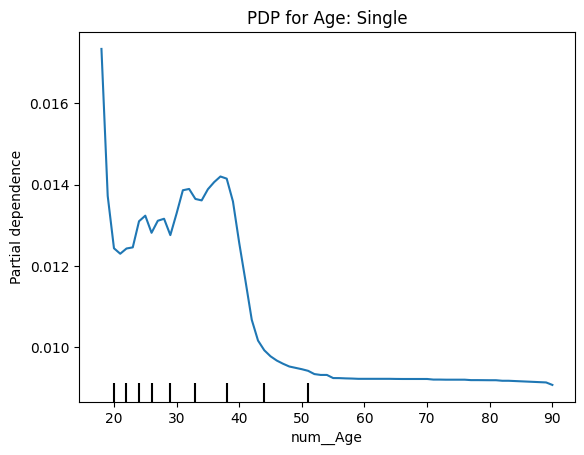

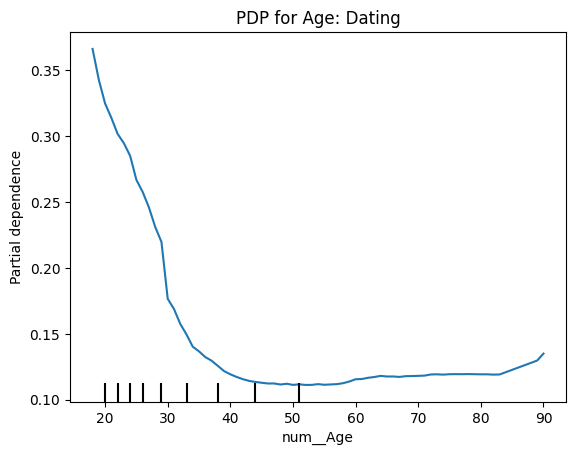

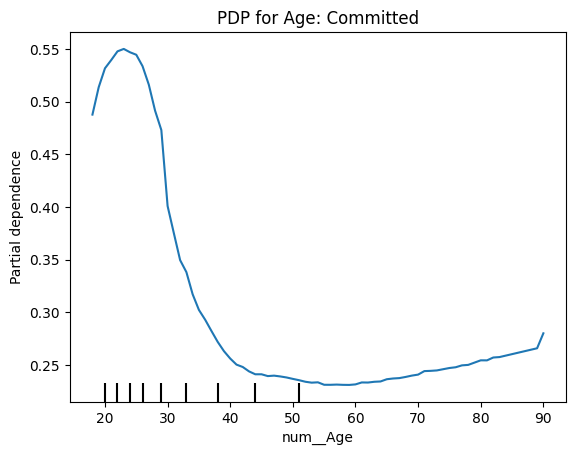

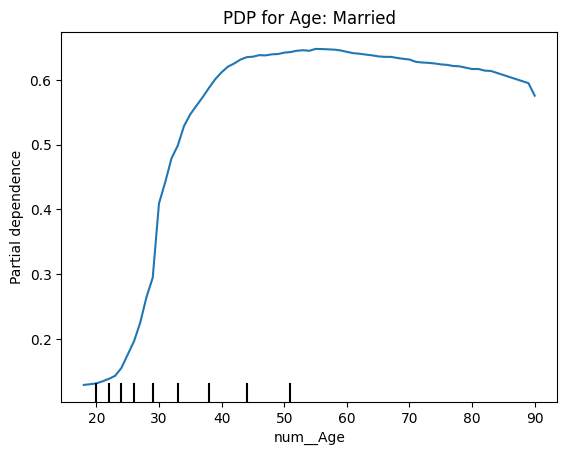

In [ ]:
# Partial Dependence Plots - Age
for t in best_rf.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=best_rf,
        X=X_test_1,
        features=["num__Age"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for Age: {class_names[t]}")
    plt.show()

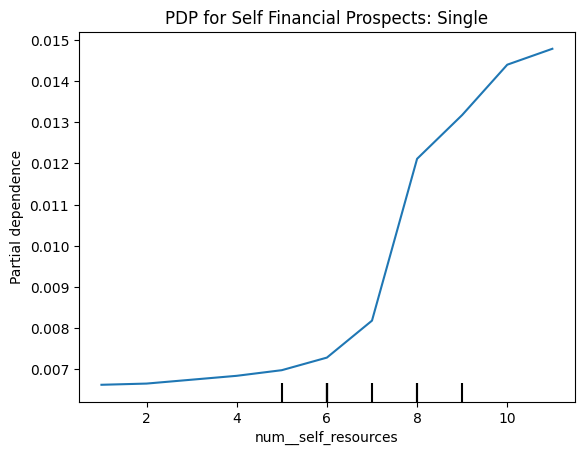

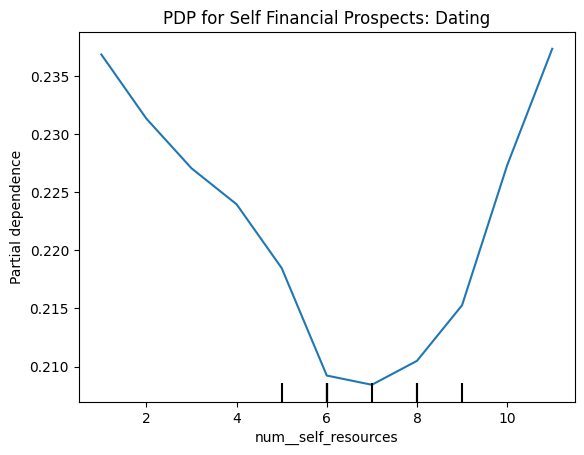

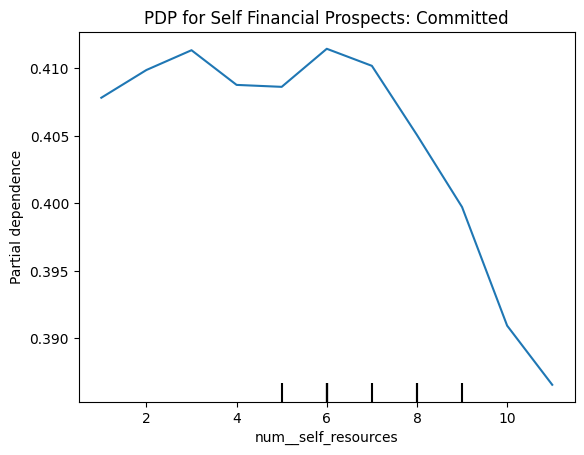

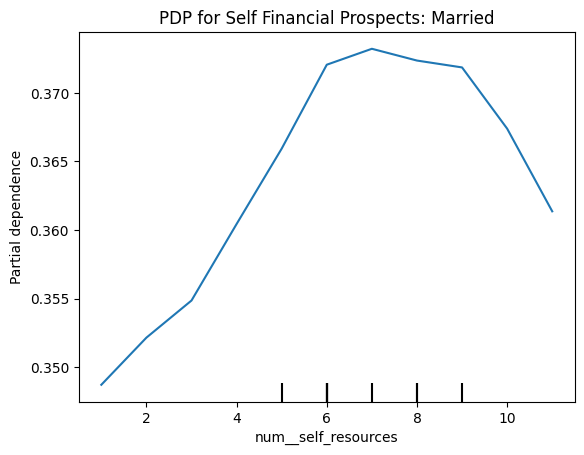

In [ ]:
# Partial Dependence Plots - Participant's self financial prospects
for t in best_rf.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=best_rf,
        X=X_test_1,
        features=["num__self_resources"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for Self Financial Prospects: {class_names[t]}")
    plt.show()

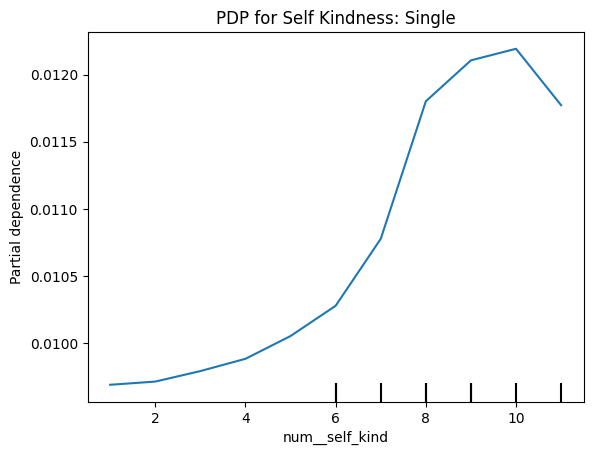

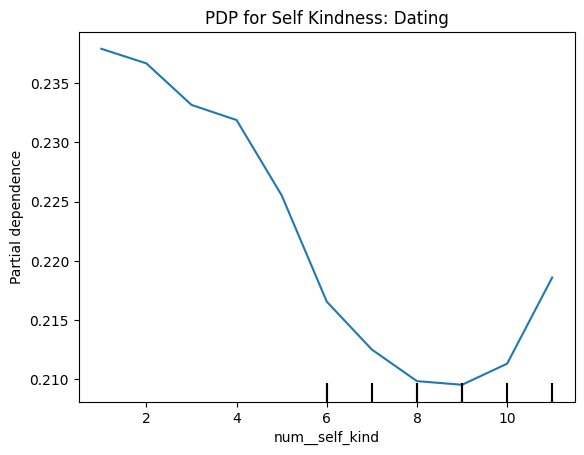

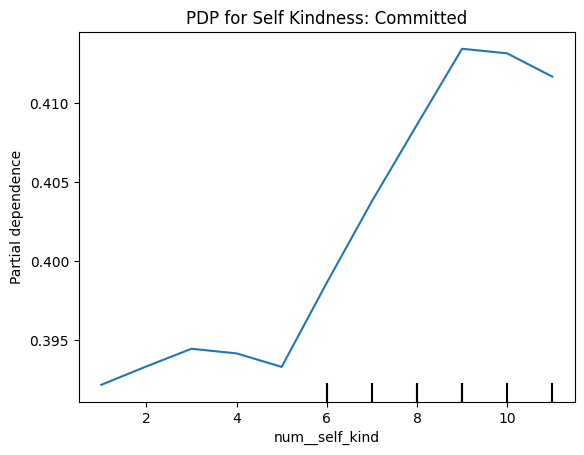

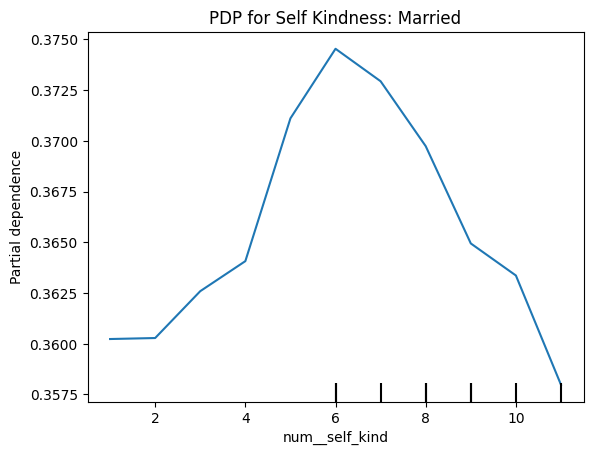

In [ ]:
# Partial Dependence Plots - Self Kindness
for t in best_rf.classes_:
    PartialDependenceDisplay.from_estimator(
        estimator=best_rf,
        X=X_test_1,
        features=["num__self_kind"],
        feature_names=feature_names,
        kind="average",
        target=t
    )
    plt.title(f"PDP for Self Kindness: {class_names[t]}")
    plt.show()